<a href="https://colab.research.google.com/github/yoyounik/GEN-AI-image-generator/blob/main/Example_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

In [4]:
trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transforms.ToTensor())

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 131MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 25.0MB/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 65.5MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 2.22MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [5]:
trainset[0]

(tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 

In [ ]:
image,label = trainset[0]
print(image.shape)

torch.Size([1, 28, 28])


In [ ]:
len(trainset)

60000

In [7]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

In [34]:
class GenBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(GenBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.ReLU(True)
    )

  def forward(self,x):
    return self.main(x)


In [35]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.main = nn.Sequential(
        GenBlock(100,256),
        GenBlock(256,512),
        GenBlock(512,1024),
        nn.Linear(1024,28*28),
        nn.Tanh()  #Transforming the values in the range of -1 and 1
    )

  def forward(self,input):
    return self.main(input).view(-1,1,28,28)


In [36]:
class DisBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(DisBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Dropout(0.2)
    )

  def forward(self,x):
    return self.main(x)

In [37]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()
    self.main = nn.Sequential(
        DisBlock(28*28,1024),
        DisBlock(1024,512),
        DisBlock(512,256),
        nn.Linear(256,1),
        nn.Sigmoid()

    )

  def forward(self,input):
    return self.main(input.view(-1,28*28))

In [38]:
generator = Generator()
discriminator = Discriminator()

criterion = nn.BCELoss()

OptimizerG = optim.Adam(generator.parameters(),lr=0.0002)
OptimizerD = optim.Adam(discriminator.parameters(),lr=0.0002)

Epoch [0/80] Batch 0/938             Loss D: 1.3878, Loss G: 0.6925
Epoch [0/80] Batch 100/938             Loss D: 0.9088, Loss G: 2.1177
Epoch [0/80] Batch 200/938             Loss D: 0.7402, Loss G: 1.3373
Epoch [0/80] Batch 300/938             Loss D: 0.9266, Loss G: 1.3713
Epoch [0/80] Batch 400/938             Loss D: 0.7213, Loss G: 2.1104
Epoch [0/80] Batch 500/938             Loss D: 0.5805, Loss G: 1.9903
Epoch [0/80] Batch 600/938             Loss D: 0.1977, Loss G: 3.5691
Epoch [0/80] Batch 700/938             Loss D: 2.1867, Loss G: 2.2413
Epoch [0/80] Batch 800/938             Loss D: 1.1755, Loss G: 6.0157
Epoch [0/80] Batch 900/938             Loss D: 0.2809, Loss G: 3.9254


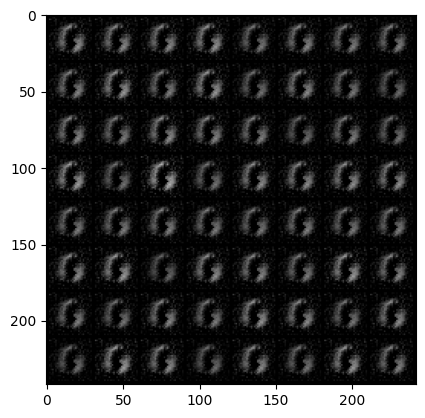

Epoch [1/80] Batch 0/938             Loss D: 0.1148, Loss G: 4.0765
Epoch [1/80] Batch 100/938             Loss D: 1.6483, Loss G: 0.7011
Epoch [1/80] Batch 200/938             Loss D: 0.3591, Loss G: 1.7516
Epoch [1/80] Batch 300/938             Loss D: 3.2307, Loss G: 2.9301
Epoch [1/80] Batch 400/938             Loss D: 0.4789, Loss G: 1.7635
Epoch [1/80] Batch 500/938             Loss D: 2.5952, Loss G: 2.5942
Epoch [1/80] Batch 600/938             Loss D: 0.4250, Loss G: 1.7842
Epoch [1/80] Batch 700/938             Loss D: 0.3714, Loss G: 3.0365
Epoch [1/80] Batch 800/938             Loss D: 5.2076, Loss G: 2.5344
Epoch [1/80] Batch 900/938             Loss D: 3.1599, Loss G: 1.5220


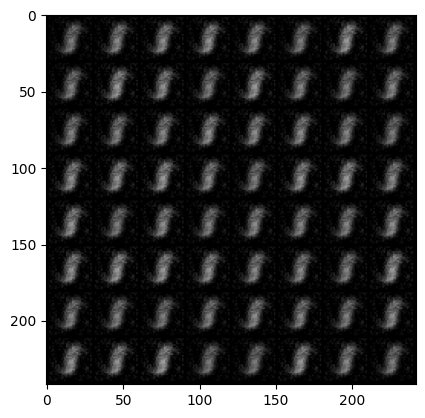

Epoch [2/80] Batch 0/938             Loss D: 0.6208, Loss G: 1.2280
Epoch [2/80] Batch 100/938             Loss D: 0.6047, Loss G: 1.3503
Epoch [2/80] Batch 200/938             Loss D: 0.3549, Loss G: 2.1163
Epoch [2/80] Batch 300/938             Loss D: 0.4516, Loss G: 2.5526
Epoch [2/80] Batch 400/938             Loss D: 1.5925, Loss G: 0.7548
Epoch [2/80] Batch 500/938             Loss D: 0.7628, Loss G: 1.0901
Epoch [2/80] Batch 600/938             Loss D: 0.1755, Loss G: 2.7578
Epoch [2/80] Batch 700/938             Loss D: 1.4274, Loss G: 4.7714
Epoch [2/80] Batch 800/938             Loss D: 1.6205, Loss G: 1.3006
Epoch [2/80] Batch 900/938             Loss D: 0.2305, Loss G: 2.0068


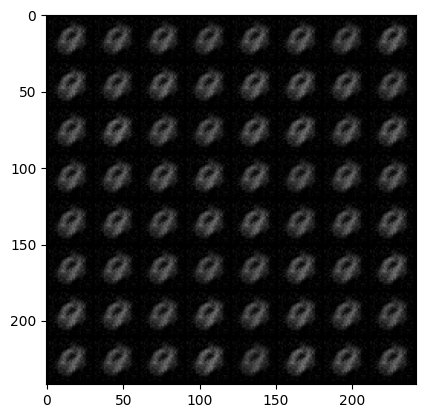

Epoch [3/80] Batch 0/938             Loss D: 0.2717, Loss G: 2.0435
Epoch [3/80] Batch 100/938             Loss D: 0.5030, Loss G: 2.6657
Epoch [3/80] Batch 200/938             Loss D: 0.6305, Loss G: 2.7485
Epoch [3/80] Batch 300/938             Loss D: 0.3539, Loss G: 2.4227
Epoch [3/80] Batch 400/938             Loss D: 2.0263, Loss G: 1.6927
Epoch [3/80] Batch 500/938             Loss D: 0.4576, Loss G: 2.5430
Epoch [3/80] Batch 600/938             Loss D: 0.2096, Loss G: 2.0077
Epoch [3/80] Batch 700/938             Loss D: 0.5670, Loss G: 3.3163
Epoch [3/80] Batch 800/938             Loss D: 1.1155, Loss G: 1.1817
Epoch [3/80] Batch 900/938             Loss D: 0.0615, Loss G: 3.4820


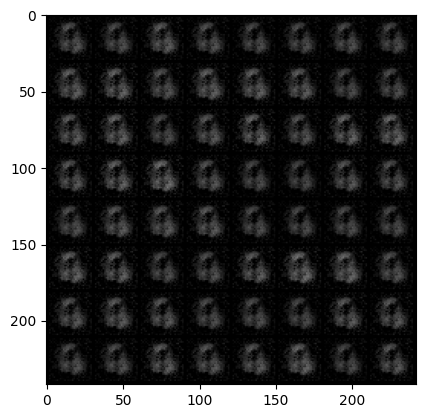

Epoch [4/80] Batch 0/938             Loss D: 0.2726, Loss G: 3.0690
Epoch [4/80] Batch 100/938             Loss D: 0.5172, Loss G: 3.8044
Epoch [4/80] Batch 200/938             Loss D: 0.2776, Loss G: 3.4881
Epoch [4/80] Batch 300/938             Loss D: 0.2348, Loss G: 6.6958
Epoch [4/80] Batch 400/938             Loss D: 0.3823, Loss G: 3.0610
Epoch [4/80] Batch 500/938             Loss D: 0.1775, Loss G: 3.4029
Epoch [4/80] Batch 600/938             Loss D: 0.5558, Loss G: 2.7573
Epoch [4/80] Batch 700/938             Loss D: 1.9149, Loss G: 2.9725
Epoch [4/80] Batch 800/938             Loss D: 0.4242, Loss G: 2.1081
Epoch [4/80] Batch 900/938             Loss D: 0.4321, Loss G: 4.6669


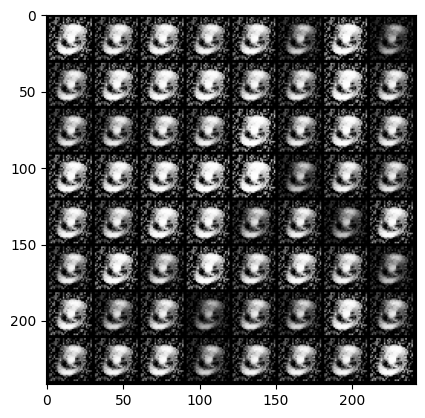

Epoch [5/80] Batch 0/938             Loss D: 0.1681, Loss G: 8.4471
Epoch [5/80] Batch 100/938             Loss D: 0.4295, Loss G: 3.0612
Epoch [5/80] Batch 200/938             Loss D: 1.1984, Loss G: 2.2103
Epoch [5/80] Batch 300/938             Loss D: 0.4451, Loss G: 3.1628
Epoch [5/80] Batch 400/938             Loss D: 0.9047, Loss G: 0.9957
Epoch [5/80] Batch 500/938             Loss D: 0.2008, Loss G: 3.3970
Epoch [5/80] Batch 600/938             Loss D: 0.4344, Loss G: 3.2115
Epoch [5/80] Batch 700/938             Loss D: 0.5367, Loss G: 5.5686
Epoch [5/80] Batch 800/938             Loss D: 0.4388, Loss G: 2.9400
Epoch [5/80] Batch 900/938             Loss D: 0.1542, Loss G: 5.9631


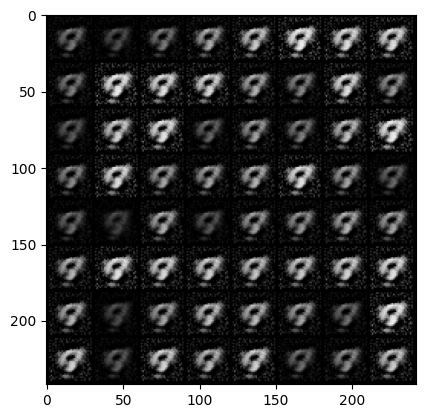

Epoch [6/80] Batch 0/938             Loss D: 0.2656, Loss G: 5.5107
Epoch [6/80] Batch 100/938             Loss D: 0.4354, Loss G: 2.3880
Epoch [6/80] Batch 200/938             Loss D: 0.1575, Loss G: 2.6314
Epoch [6/80] Batch 300/938             Loss D: 0.4517, Loss G: 2.7878
Epoch [6/80] Batch 400/938             Loss D: 0.5227, Loss G: 2.9289
Epoch [6/80] Batch 500/938             Loss D: 0.4159, Loss G: 2.9797
Epoch [6/80] Batch 600/938             Loss D: 0.5187, Loss G: 2.2587
Epoch [6/80] Batch 700/938             Loss D: 0.6202, Loss G: 4.2243
Epoch [6/80] Batch 800/938             Loss D: 0.1661, Loss G: 3.6167
Epoch [6/80] Batch 900/938             Loss D: 0.8287, Loss G: 3.2714


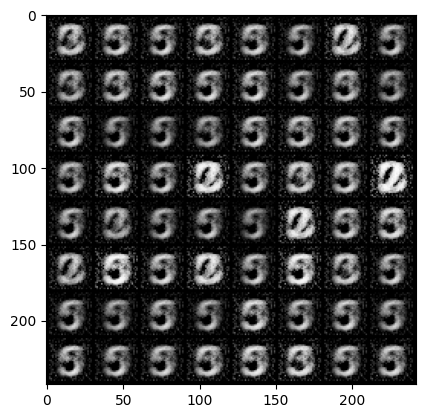

Epoch [7/80] Batch 0/938             Loss D: 1.2120, Loss G: 5.0327
Epoch [7/80] Batch 100/938             Loss D: 0.3909, Loss G: 2.4315
Epoch [7/80] Batch 200/938             Loss D: 0.5695, Loss G: 3.1584
Epoch [7/80] Batch 300/938             Loss D: 0.8299, Loss G: 3.9519
Epoch [7/80] Batch 400/938             Loss D: 0.2478, Loss G: 2.7072
Epoch [7/80] Batch 500/938             Loss D: 0.3133, Loss G: 4.5901
Epoch [7/80] Batch 600/938             Loss D: 0.3538, Loss G: 2.9141
Epoch [7/80] Batch 700/938             Loss D: 0.2216, Loss G: 3.1913
Epoch [7/80] Batch 800/938             Loss D: 0.9703, Loss G: 3.0841
Epoch [7/80] Batch 900/938             Loss D: 0.6058, Loss G: 2.7097


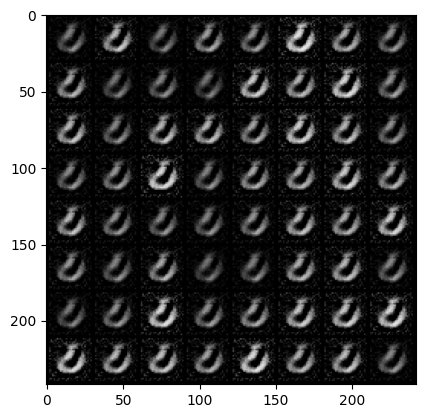

Epoch [8/80] Batch 0/938             Loss D: 0.2159, Loss G: 3.5325
Epoch [8/80] Batch 100/938             Loss D: 0.3706, Loss G: 4.6233
Epoch [8/80] Batch 200/938             Loss D: 1.4271, Loss G: 2.1578
Epoch [8/80] Batch 300/938             Loss D: 0.3227, Loss G: 4.1293
Epoch [8/80] Batch 400/938             Loss D: 0.4225, Loss G: 6.6713
Epoch [8/80] Batch 500/938             Loss D: 0.5452, Loss G: 2.2858
Epoch [8/80] Batch 600/938             Loss D: 0.5208, Loss G: 2.7985
Epoch [8/80] Batch 700/938             Loss D: 0.2321, Loss G: 3.0040
Epoch [8/80] Batch 800/938             Loss D: 0.2628, Loss G: 4.1161
Epoch [8/80] Batch 900/938             Loss D: 1.1794, Loss G: 2.9874


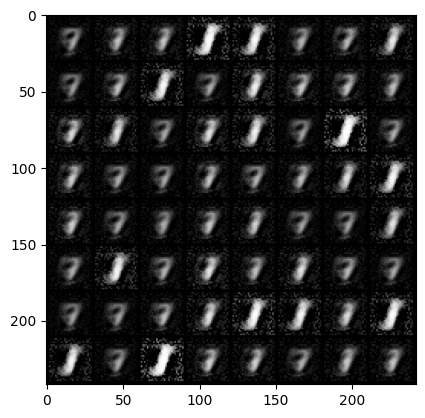

Epoch [9/80] Batch 0/938             Loss D: 0.7489, Loss G: 1.9082
Epoch [9/80] Batch 100/938             Loss D: 0.9183, Loss G: 2.6847
Epoch [9/80] Batch 200/938             Loss D: 0.2103, Loss G: 3.2863
Epoch [9/80] Batch 300/938             Loss D: 0.2920, Loss G: 5.0252
Epoch [9/80] Batch 400/938             Loss D: 0.7526, Loss G: 1.8328
Epoch [9/80] Batch 500/938             Loss D: 0.7632, Loss G: 2.6435
Epoch [9/80] Batch 600/938             Loss D: 0.2541, Loss G: 2.8444
Epoch [9/80] Batch 700/938             Loss D: 0.1713, Loss G: 4.3706
Epoch [9/80] Batch 800/938             Loss D: 0.9516, Loss G: 5.1776
Epoch [9/80] Batch 900/938             Loss D: 0.1354, Loss G: 2.9350


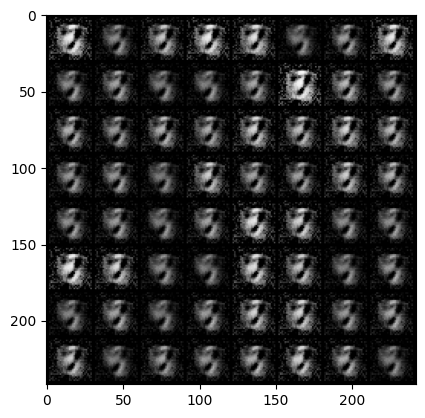

Epoch [10/80] Batch 0/938             Loss D: 0.5402, Loss G: 7.0190
Epoch [10/80] Batch 100/938             Loss D: 0.5247, Loss G: 3.2232
Epoch [10/80] Batch 200/938             Loss D: 0.3270, Loss G: 2.9035
Epoch [10/80] Batch 300/938             Loss D: 0.8539, Loss G: 2.4628
Epoch [10/80] Batch 400/938             Loss D: 0.4002, Loss G: 2.7200
Epoch [10/80] Batch 500/938             Loss D: 0.8552, Loss G: 2.4344
Epoch [10/80] Batch 600/938             Loss D: 0.1970, Loss G: 3.4737
Epoch [10/80] Batch 700/938             Loss D: 0.1345, Loss G: 4.6908
Epoch [10/80] Batch 800/938             Loss D: 0.2918, Loss G: 2.6223
Epoch [10/80] Batch 900/938             Loss D: 0.4480, Loss G: 2.6386


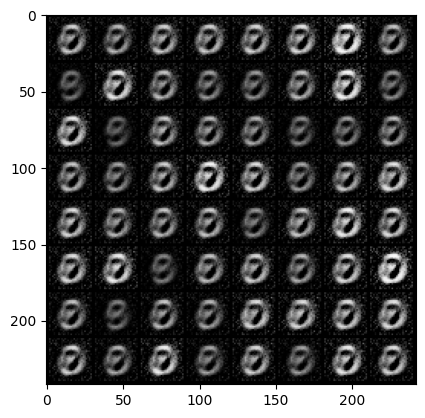

Epoch [11/80] Batch 0/938             Loss D: 0.2995, Loss G: 2.9948
Epoch [11/80] Batch 100/938             Loss D: 0.2946, Loss G: 3.8408
Epoch [11/80] Batch 200/938             Loss D: 1.0341, Loss G: 3.2545
Epoch [11/80] Batch 300/938             Loss D: 1.0430, Loss G: 2.8081
Epoch [11/80] Batch 400/938             Loss D: 0.5860, Loss G: 2.9865
Epoch [11/80] Batch 500/938             Loss D: 0.2143, Loss G: 3.3407
Epoch [11/80] Batch 600/938             Loss D: 0.4489, Loss G: 4.8662
Epoch [11/80] Batch 700/938             Loss D: 0.4551, Loss G: 3.3436
Epoch [11/80] Batch 800/938             Loss D: 0.2703, Loss G: 2.9877
Epoch [11/80] Batch 900/938             Loss D: 0.3798, Loss G: 4.4691


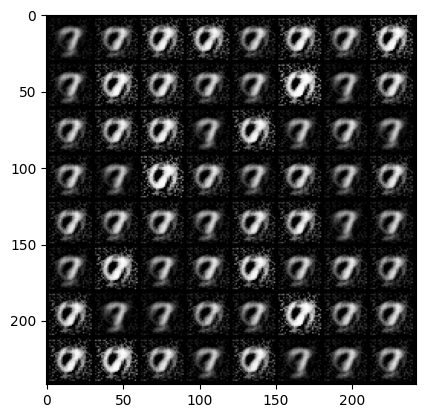

Epoch [12/80] Batch 0/938             Loss D: 0.5447, Loss G: 3.1282
Epoch [12/80] Batch 100/938             Loss D: 0.8256, Loss G: 2.1668
Epoch [12/80] Batch 200/938             Loss D: 0.7588, Loss G: 1.9173
Epoch [12/80] Batch 300/938             Loss D: 0.2592, Loss G: 3.5174
Epoch [12/80] Batch 400/938             Loss D: 2.2055, Loss G: 3.9370
Epoch [12/80] Batch 500/938             Loss D: 0.3306, Loss G: 2.6046
Epoch [12/80] Batch 600/938             Loss D: 0.8458, Loss G: 3.5930
Epoch [12/80] Batch 700/938             Loss D: 0.6079, Loss G: 2.3228
Epoch [12/80] Batch 800/938             Loss D: 0.8852, Loss G: 2.4896
Epoch [12/80] Batch 900/938             Loss D: 0.3583, Loss G: 3.4647


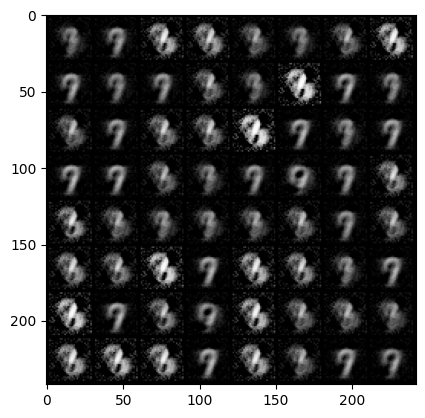

Epoch [13/80] Batch 0/938             Loss D: 0.4882, Loss G: 3.0526
Epoch [13/80] Batch 100/938             Loss D: 0.9496, Loss G: 2.9298
Epoch [13/80] Batch 200/938             Loss D: 0.3124, Loss G: 2.1676
Epoch [13/80] Batch 300/938             Loss D: 0.4621, Loss G: 3.6861
Epoch [13/80] Batch 400/938             Loss D: 0.6554, Loss G: 2.2222
Epoch [13/80] Batch 500/938             Loss D: 0.3862, Loss G: 3.4882
Epoch [13/80] Batch 600/938             Loss D: 0.1743, Loss G: 3.7247
Epoch [13/80] Batch 700/938             Loss D: 0.7320, Loss G: 2.1902
Epoch [13/80] Batch 800/938             Loss D: 0.5649, Loss G: 7.1936
Epoch [13/80] Batch 900/938             Loss D: 0.1806, Loss G: 3.8129


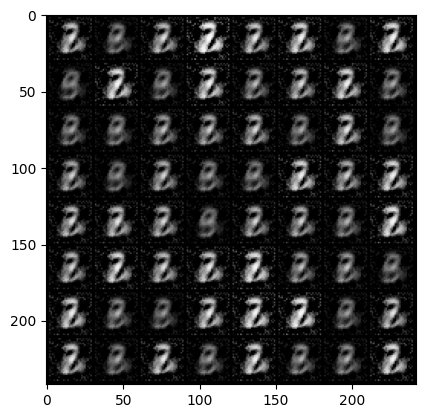

Epoch [14/80] Batch 0/938             Loss D: 0.3735, Loss G: 3.6931
Epoch [14/80] Batch 100/938             Loss D: 1.0891, Loss G: 3.6294
Epoch [14/80] Batch 200/938             Loss D: 0.6573, Loss G: 2.9290
Epoch [14/80] Batch 300/938             Loss D: 0.3633, Loss G: 3.5016
Epoch [14/80] Batch 400/938             Loss D: 0.6228, Loss G: 5.9734
Epoch [14/80] Batch 500/938             Loss D: 0.4093, Loss G: 4.3502
Epoch [14/80] Batch 600/938             Loss D: 0.8045, Loss G: 2.7189
Epoch [14/80] Batch 700/938             Loss D: 0.2007, Loss G: 2.9841
Epoch [14/80] Batch 800/938             Loss D: 0.5696, Loss G: 5.2940
Epoch [14/80] Batch 900/938             Loss D: 0.3477, Loss G: 2.6432


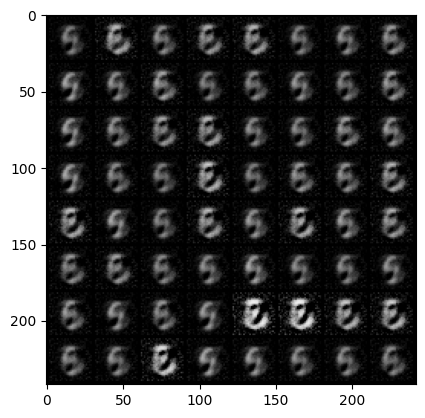

Epoch [15/80] Batch 0/938             Loss D: 0.2038, Loss G: 3.9963
Epoch [15/80] Batch 100/938             Loss D: 0.6001, Loss G: 4.8065
Epoch [15/80] Batch 200/938             Loss D: 0.5143, Loss G: 2.5201
Epoch [15/80] Batch 300/938             Loss D: 0.2699, Loss G: 3.4705
Epoch [15/80] Batch 400/938             Loss D: 0.4924, Loss G: 4.0286
Epoch [15/80] Batch 500/938             Loss D: 0.5415, Loss G: 2.3019
Epoch [15/80] Batch 600/938             Loss D: 0.5674, Loss G: 4.4026
Epoch [15/80] Batch 700/938             Loss D: 0.3083, Loss G: 4.2601
Epoch [15/80] Batch 800/938             Loss D: 0.1166, Loss G: 4.9728
Epoch [15/80] Batch 900/938             Loss D: 1.1931, Loss G: 6.5879


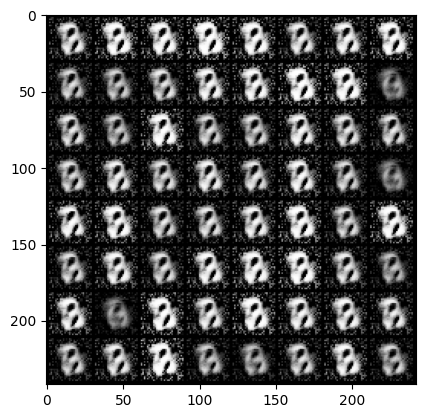

Epoch [16/80] Batch 0/938             Loss D: 0.6080, Loss G: 3.1938
Epoch [16/80] Batch 100/938             Loss D: 0.3469, Loss G: 2.8516
Epoch [16/80] Batch 200/938             Loss D: 0.2631, Loss G: 4.4547
Epoch [16/80] Batch 300/938             Loss D: 0.5856, Loss G: 1.8704
Epoch [16/80] Batch 400/938             Loss D: 0.4355, Loss G: 3.7885
Epoch [16/80] Batch 500/938             Loss D: 0.4767, Loss G: 2.3697
Epoch [16/80] Batch 600/938             Loss D: 0.4295, Loss G: 8.5139
Epoch [16/80] Batch 700/938             Loss D: 0.6779, Loss G: 2.5959
Epoch [16/80] Batch 800/938             Loss D: 0.2300, Loss G: 3.9939
Epoch [16/80] Batch 900/938             Loss D: 0.2342, Loss G: 2.3973


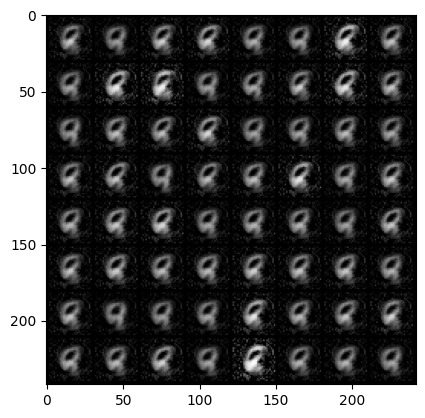

Epoch [17/80] Batch 0/938             Loss D: 0.3357, Loss G: 2.5978
Epoch [17/80] Batch 100/938             Loss D: 0.1229, Loss G: 3.8135
Epoch [17/80] Batch 200/938             Loss D: 0.2132, Loss G: 3.7237
Epoch [17/80] Batch 300/938             Loss D: 0.2679, Loss G: 2.1790
Epoch [17/80] Batch 400/938             Loss D: 0.6931, Loss G: 4.3144
Epoch [17/80] Batch 500/938             Loss D: 0.2122, Loss G: 4.3794
Epoch [17/80] Batch 600/938             Loss D: 0.2745, Loss G: 2.8010
Epoch [17/80] Batch 700/938             Loss D: 0.5274, Loss G: 3.9631
Epoch [17/80] Batch 800/938             Loss D: 0.4178, Loss G: 4.5813
Epoch [17/80] Batch 900/938             Loss D: 1.6016, Loss G: 2.7463


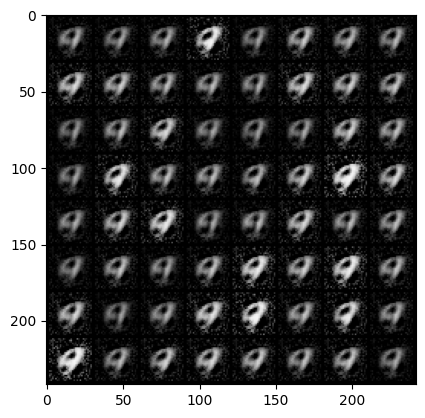

Epoch [18/80] Batch 0/938             Loss D: 0.4744, Loss G: 3.3658
Epoch [18/80] Batch 100/938             Loss D: 0.6278, Loss G: 3.8831
Epoch [18/80] Batch 200/938             Loss D: 0.2626, Loss G: 4.1271
Epoch [18/80] Batch 300/938             Loss D: 0.6390, Loss G: 3.7285
Epoch [18/80] Batch 400/938             Loss D: 0.5710, Loss G: 2.6996
Epoch [18/80] Batch 500/938             Loss D: 0.2422, Loss G: 3.4903
Epoch [18/80] Batch 600/938             Loss D: 0.5793, Loss G: 2.9662
Epoch [18/80] Batch 700/938             Loss D: 0.8439, Loss G: 3.6818
Epoch [18/80] Batch 800/938             Loss D: 0.2941, Loss G: 4.3915
Epoch [18/80] Batch 900/938             Loss D: 0.3233, Loss G: 3.0389


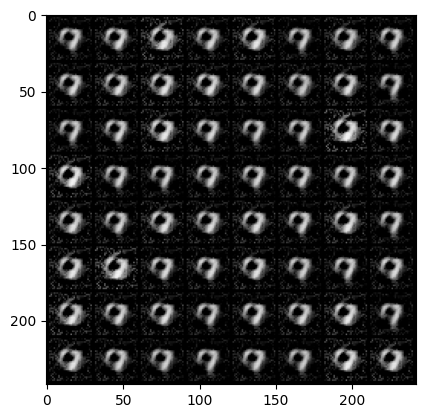

Epoch [19/80] Batch 0/938             Loss D: 0.2959, Loss G: 4.5007
Epoch [19/80] Batch 100/938             Loss D: 0.1808, Loss G: 3.1511
Epoch [19/80] Batch 200/938             Loss D: 0.3607, Loss G: 2.8824
Epoch [19/80] Batch 300/938             Loss D: 0.6771, Loss G: 4.0247
Epoch [19/80] Batch 400/938             Loss D: 0.1888, Loss G: 5.3971
Epoch [19/80] Batch 500/938             Loss D: 0.6968, Loss G: 5.7841
Epoch [19/80] Batch 600/938             Loss D: 0.6234, Loss G: 7.5062
Epoch [19/80] Batch 700/938             Loss D: 0.8212, Loss G: 8.9032
Epoch [19/80] Batch 800/938             Loss D: 0.0961, Loss G: 4.1098
Epoch [19/80] Batch 900/938             Loss D: 0.6698, Loss G: 2.6372


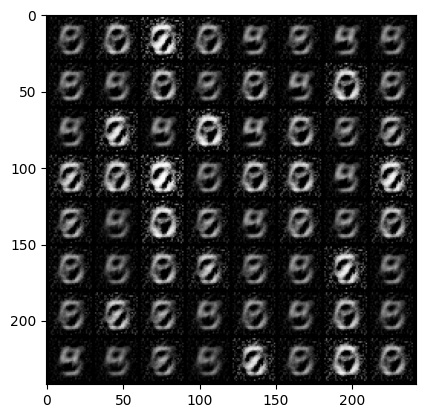

Epoch [20/80] Batch 0/938             Loss D: 0.3299, Loss G: 3.9607
Epoch [20/80] Batch 100/938             Loss D: 0.2926, Loss G: 3.0991
Epoch [20/80] Batch 200/938             Loss D: 0.5264, Loss G: 4.6441
Epoch [20/80] Batch 300/938             Loss D: 0.7687, Loss G: 4.4016
Epoch [20/80] Batch 400/938             Loss D: 0.5720, Loss G: 2.1984
Epoch [20/80] Batch 500/938             Loss D: 0.2746, Loss G: 2.7896
Epoch [20/80] Batch 600/938             Loss D: 0.4455, Loss G: 5.2686
Epoch [20/80] Batch 700/938             Loss D: 0.4993, Loss G: 2.4515
Epoch [20/80] Batch 800/938             Loss D: 0.1738, Loss G: 2.7474
Epoch [20/80] Batch 900/938             Loss D: 0.8773, Loss G: 3.9081


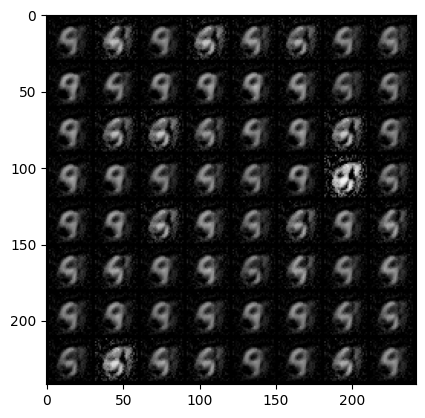

Epoch [21/80] Batch 0/938             Loss D: 0.2373, Loss G: 3.0417
Epoch [21/80] Batch 100/938             Loss D: 1.1764, Loss G: 6.2413
Epoch [21/80] Batch 200/938             Loss D: 0.3125, Loss G: 2.2308
Epoch [21/80] Batch 300/938             Loss D: 0.3654, Loss G: 3.5927
Epoch [21/80] Batch 400/938             Loss D: 0.1090, Loss G: 4.8287
Epoch [21/80] Batch 500/938             Loss D: 0.2684, Loss G: 3.9077
Epoch [21/80] Batch 600/938             Loss D: 0.7232, Loss G: 3.0197
Epoch [21/80] Batch 700/938             Loss D: 0.3236, Loss G: 2.8051
Epoch [21/80] Batch 800/938             Loss D: 0.3049, Loss G: 5.3625
Epoch [21/80] Batch 900/938             Loss D: 0.6300, Loss G: 2.5926


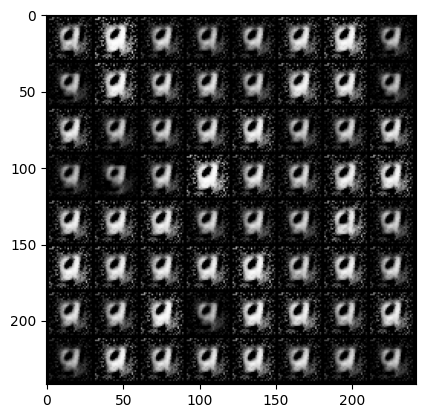

Epoch [22/80] Batch 0/938             Loss D: 0.3083, Loss G: 3.6865
Epoch [22/80] Batch 100/938             Loss D: 0.2541, Loss G: 3.3610
Epoch [22/80] Batch 200/938             Loss D: 0.4449, Loss G: 3.7901
Epoch [22/80] Batch 300/938             Loss D: 0.5823, Loss G: 3.4341
Epoch [22/80] Batch 400/938             Loss D: 0.9896, Loss G: 4.4603
Epoch [22/80] Batch 500/938             Loss D: 0.7115, Loss G: 1.7836
Epoch [22/80] Batch 600/938             Loss D: 0.3879, Loss G: 2.8942
Epoch [22/80] Batch 700/938             Loss D: 0.2053, Loss G: 5.1401
Epoch [22/80] Batch 800/938             Loss D: 0.3899, Loss G: 8.1538
Epoch [22/80] Batch 900/938             Loss D: 0.5917, Loss G: 4.4789


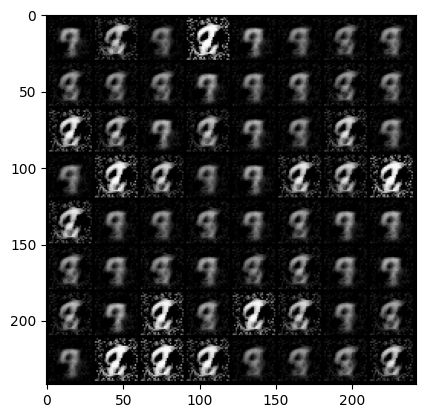

Epoch [23/80] Batch 0/938             Loss D: 0.3187, Loss G: 3.5644
Epoch [23/80] Batch 100/938             Loss D: 0.1723, Loss G: 4.6349
Epoch [23/80] Batch 200/938             Loss D: 0.6258, Loss G: 3.8588
Epoch [23/80] Batch 300/938             Loss D: 0.3004, Loss G: 3.0837
Epoch [23/80] Batch 400/938             Loss D: 0.2093, Loss G: 5.5025
Epoch [23/80] Batch 500/938             Loss D: 0.0954, Loss G: 3.5323
Epoch [23/80] Batch 600/938             Loss D: 0.2931, Loss G: 4.1794
Epoch [23/80] Batch 700/938             Loss D: 0.6424, Loss G: 4.9850
Epoch [23/80] Batch 800/938             Loss D: 0.4159, Loss G: 4.2485
Epoch [23/80] Batch 900/938             Loss D: 0.4747, Loss G: 4.6714


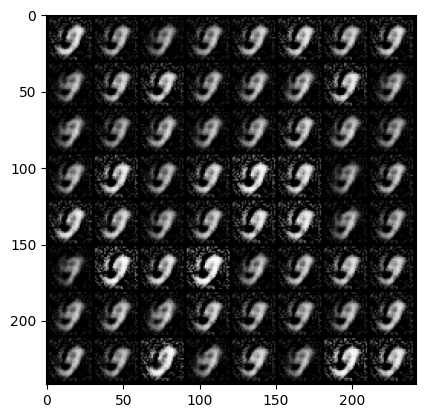

Epoch [24/80] Batch 0/938             Loss D: 0.3561, Loss G: 3.5607
Epoch [24/80] Batch 100/938             Loss D: 0.3896, Loss G: 3.7601
Epoch [24/80] Batch 200/938             Loss D: 0.2405, Loss G: 3.7724
Epoch [24/80] Batch 300/938             Loss D: 0.3972, Loss G: 3.8639
Epoch [24/80] Batch 400/938             Loss D: 0.3717, Loss G: 4.5765
Epoch [24/80] Batch 500/938             Loss D: 0.2308, Loss G: 3.9815
Epoch [24/80] Batch 600/938             Loss D: 0.2474, Loss G: 3.9079
Epoch [24/80] Batch 700/938             Loss D: 0.5367, Loss G: 3.8826
Epoch [24/80] Batch 800/938             Loss D: 0.2848, Loss G: 3.2323
Epoch [24/80] Batch 900/938             Loss D: 0.2476, Loss G: 3.4877


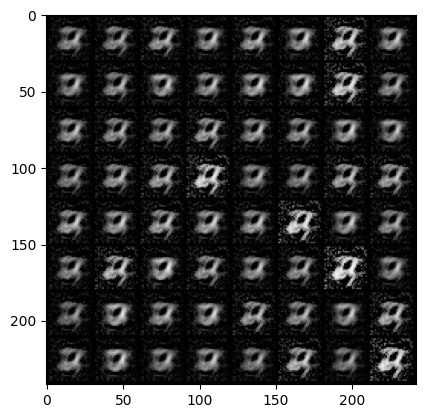

Epoch [25/80] Batch 0/938             Loss D: 0.3164, Loss G: 3.9364
Epoch [25/80] Batch 100/938             Loss D: 0.2057, Loss G: 3.4770
Epoch [25/80] Batch 200/938             Loss D: 0.5990, Loss G: 4.5198
Epoch [25/80] Batch 300/938             Loss D: 0.2151, Loss G: 4.2276
Epoch [25/80] Batch 400/938             Loss D: 0.2190, Loss G: 6.0958
Epoch [25/80] Batch 500/938             Loss D: 0.2100, Loss G: 5.2151
Epoch [25/80] Batch 600/938             Loss D: 0.3106, Loss G: 4.7235
Epoch [25/80] Batch 700/938             Loss D: 0.7522, Loss G: 9.8661
Epoch [25/80] Batch 800/938             Loss D: 0.4606, Loss G: 5.0905
Epoch [25/80] Batch 900/938             Loss D: 0.0713, Loss G: 4.5536


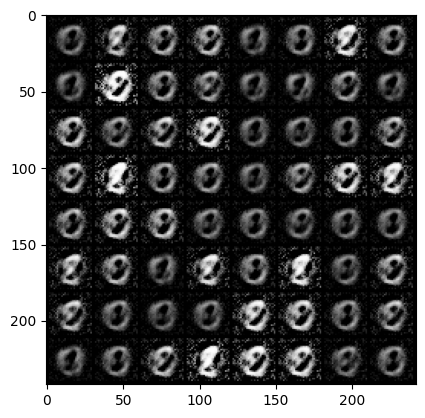

Epoch [26/80] Batch 0/938             Loss D: 1.0074, Loss G: 3.6332
Epoch [26/80] Batch 100/938             Loss D: 0.4019, Loss G: 2.7371
Epoch [26/80] Batch 200/938             Loss D: 0.2657, Loss G: 5.8656
Epoch [26/80] Batch 300/938             Loss D: 0.3410, Loss G: 3.3149
Epoch [26/80] Batch 400/938             Loss D: 0.2180, Loss G: 4.5300
Epoch [26/80] Batch 500/938             Loss D: 0.5011, Loss G: 4.1285
Epoch [26/80] Batch 600/938             Loss D: 1.1965, Loss G: 2.7248
Epoch [26/80] Batch 700/938             Loss D: 0.1893, Loss G: 3.7104
Epoch [26/80] Batch 800/938             Loss D: 0.1934, Loss G: 6.1669
Epoch [26/80] Batch 900/938             Loss D: 0.1286, Loss G: 3.8709


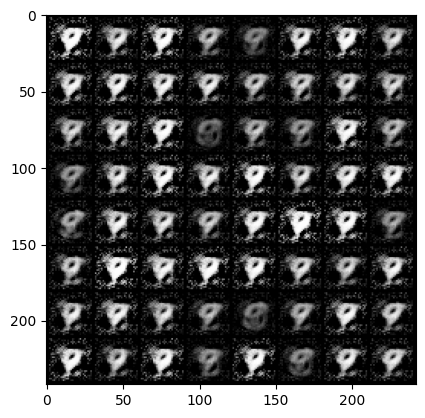

Epoch [27/80] Batch 0/938             Loss D: 0.2931, Loss G: 7.3692
Epoch [27/80] Batch 100/938             Loss D: 0.2077, Loss G: 3.4898
Epoch [27/80] Batch 200/938             Loss D: 0.1923, Loss G: 2.9528
Epoch [27/80] Batch 300/938             Loss D: 0.5737, Loss G: 4.7098
Epoch [27/80] Batch 400/938             Loss D: 0.4283, Loss G: 3.4016
Epoch [27/80] Batch 500/938             Loss D: 0.5932, Loss G: 4.8380
Epoch [27/80] Batch 600/938             Loss D: 0.6010, Loss G: 5.1377
Epoch [27/80] Batch 700/938             Loss D: 0.0908, Loss G: 5.7455
Epoch [27/80] Batch 800/938             Loss D: 0.4411, Loss G: 4.4676
Epoch [27/80] Batch 900/938             Loss D: 0.2862, Loss G: 5.4511


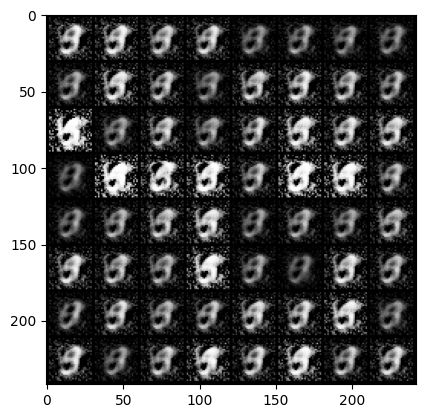

Epoch [28/80] Batch 0/938             Loss D: 0.7107, Loss G: 3.5262
Epoch [28/80] Batch 100/938             Loss D: 0.4464, Loss G: 3.6024
Epoch [28/80] Batch 200/938             Loss D: 0.2142, Loss G: 4.9811
Epoch [28/80] Batch 300/938             Loss D: 0.4709, Loss G: 5.9725
Epoch [28/80] Batch 400/938             Loss D: 0.2521, Loss G: 4.7825
Epoch [28/80] Batch 500/938             Loss D: 0.1705, Loss G: 6.6934
Epoch [28/80] Batch 600/938             Loss D: 0.3583, Loss G: 2.7430
Epoch [28/80] Batch 700/938             Loss D: 0.2554, Loss G: 3.0806
Epoch [28/80] Batch 800/938             Loss D: 0.3300, Loss G: 4.0159
Epoch [28/80] Batch 900/938             Loss D: 1.1265, Loss G: 4.5249


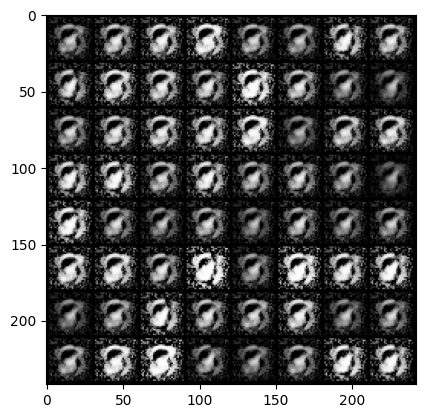

Epoch [29/80] Batch 0/938             Loss D: 0.4629, Loss G: 3.5591
Epoch [29/80] Batch 100/938             Loss D: 0.3284, Loss G: 3.2285
Epoch [29/80] Batch 200/938             Loss D: 0.3721, Loss G: 4.1505
Epoch [29/80] Batch 300/938             Loss D: 0.4584, Loss G: 3.3738
Epoch [29/80] Batch 400/938             Loss D: 0.3403, Loss G: 4.3459
Epoch [29/80] Batch 500/938             Loss D: 0.7114, Loss G: 4.4503
Epoch [29/80] Batch 600/938             Loss D: 0.4288, Loss G: 2.9492
Epoch [29/80] Batch 700/938             Loss D: 0.6221, Loss G: 2.8850
Epoch [29/80] Batch 800/938             Loss D: 0.3566, Loss G: 3.3858
Epoch [29/80] Batch 900/938             Loss D: 0.2857, Loss G: 3.5743


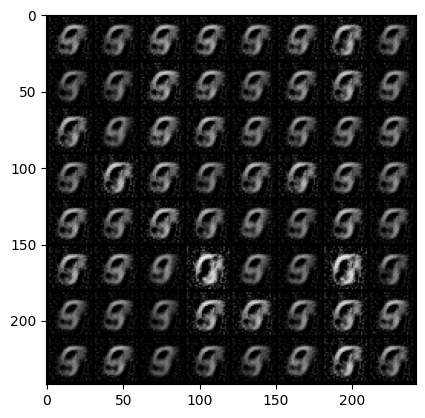

Epoch [30/80] Batch 0/938             Loss D: 0.1013, Loss G: 3.6482
Epoch [30/80] Batch 100/938             Loss D: 0.6825, Loss G: 2.2401
Epoch [30/80] Batch 200/938             Loss D: 0.2869, Loss G: 6.6412
Epoch [30/80] Batch 300/938             Loss D: 0.1692, Loss G: 4.3595
Epoch [30/80] Batch 400/938             Loss D: 0.3036, Loss G: 4.1376
Epoch [30/80] Batch 500/938             Loss D: 0.1787, Loss G: 2.9108
Epoch [30/80] Batch 600/938             Loss D: 0.3964, Loss G: 2.8014
Epoch [30/80] Batch 700/938             Loss D: 0.2723, Loss G: 5.4082
Epoch [30/80] Batch 800/938             Loss D: 0.5794, Loss G: 3.5626
Epoch [30/80] Batch 900/938             Loss D: 0.5585, Loss G: 4.3196


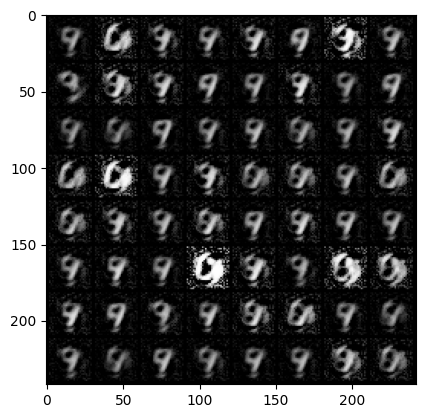

Epoch [31/80] Batch 0/938             Loss D: 0.4933, Loss G: 2.8420
Epoch [31/80] Batch 100/938             Loss D: 0.4035, Loss G: 3.1360
Epoch [31/80] Batch 200/938             Loss D: 0.4868, Loss G: 4.5609
Epoch [31/80] Batch 300/938             Loss D: 0.7509, Loss G: 3.0386
Epoch [31/80] Batch 400/938             Loss D: 0.3874, Loss G: 3.7748
Epoch [31/80] Batch 500/938             Loss D: 0.2378, Loss G: 4.1136
Epoch [31/80] Batch 600/938             Loss D: 0.2018, Loss G: 4.6149
Epoch [31/80] Batch 700/938             Loss D: 0.6036, Loss G: 2.1297
Epoch [31/80] Batch 800/938             Loss D: 0.5405, Loss G: 3.1661
Epoch [31/80] Batch 900/938             Loss D: 0.4557, Loss G: 4.0165


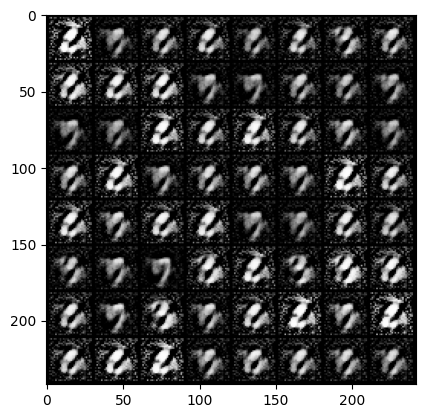

Epoch [32/80] Batch 0/938             Loss D: 0.4788, Loss G: 6.7787
Epoch [32/80] Batch 100/938             Loss D: 0.2300, Loss G: 4.5310
Epoch [32/80] Batch 200/938             Loss D: 0.3733, Loss G: 3.0771
Epoch [32/80] Batch 300/938             Loss D: 0.5734, Loss G: 4.3303
Epoch [32/80] Batch 400/938             Loss D: 0.5239, Loss G: 5.4733
Epoch [32/80] Batch 500/938             Loss D: 0.1193, Loss G: 3.1379
Epoch [32/80] Batch 600/938             Loss D: 0.5894, Loss G: 3.0960
Epoch [32/80] Batch 700/938             Loss D: 0.5733, Loss G: 6.4478
Epoch [32/80] Batch 800/938             Loss D: 0.6920, Loss G: 2.3564
Epoch [32/80] Batch 900/938             Loss D: 0.6845, Loss G: 2.1513


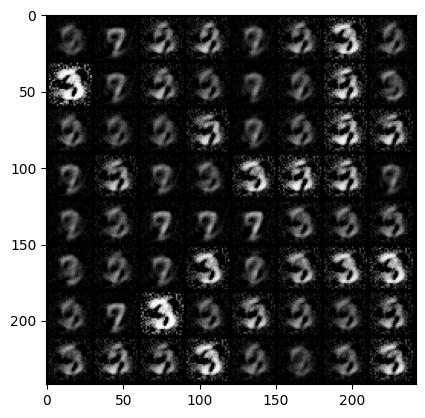

Epoch [33/80] Batch 0/938             Loss D: 0.1881, Loss G: 3.3856
Epoch [33/80] Batch 100/938             Loss D: 0.2069, Loss G: 5.1177
Epoch [33/80] Batch 200/938             Loss D: 0.6200, Loss G: 2.9498
Epoch [33/80] Batch 300/938             Loss D: 0.8892, Loss G: 3.3174
Epoch [33/80] Batch 400/938             Loss D: 0.3203, Loss G: 3.1086
Epoch [33/80] Batch 500/938             Loss D: 0.2682, Loss G: 7.4778
Epoch [33/80] Batch 600/938             Loss D: 0.3450, Loss G: 3.7826
Epoch [33/80] Batch 700/938             Loss D: 0.4419, Loss G: 3.2436
Epoch [33/80] Batch 800/938             Loss D: 0.4477, Loss G: 4.9443
Epoch [33/80] Batch 900/938             Loss D: 0.4201, Loss G: 3.1534


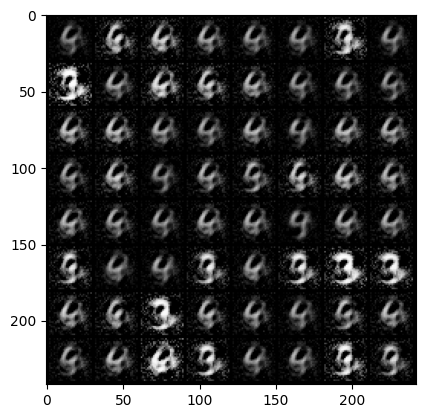

Epoch [34/80] Batch 0/938             Loss D: 0.2411, Loss G: 4.4928
Epoch [34/80] Batch 100/938             Loss D: 0.1797, Loss G: 4.3168
Epoch [34/80] Batch 200/938             Loss D: 0.4232, Loss G: 3.5824
Epoch [34/80] Batch 300/938             Loss D: 0.3941, Loss G: 2.9529
Epoch [34/80] Batch 400/938             Loss D: 0.5253, Loss G: 3.7940
Epoch [34/80] Batch 500/938             Loss D: 0.3608, Loss G: 4.2772
Epoch [34/80] Batch 600/938             Loss D: 0.3396, Loss G: 3.1873
Epoch [34/80] Batch 700/938             Loss D: 0.5776, Loss G: 4.2919
Epoch [34/80] Batch 800/938             Loss D: 0.6905, Loss G: 6.8748
Epoch [34/80] Batch 900/938             Loss D: 0.3231, Loss G: 4.0889


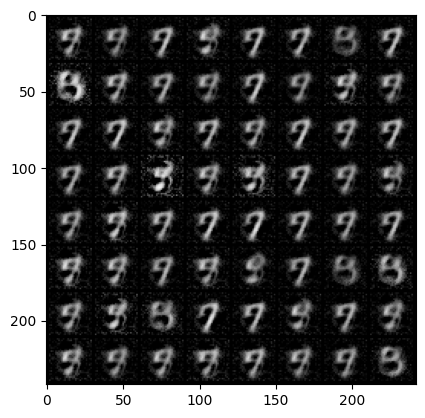

Epoch [35/80] Batch 0/938             Loss D: 0.2143, Loss G: 3.1485
Epoch [35/80] Batch 100/938             Loss D: 0.7540, Loss G: 4.9804
Epoch [35/80] Batch 200/938             Loss D: 0.4848, Loss G: 3.1933
Epoch [35/80] Batch 300/938             Loss D: 0.4230, Loss G: 3.0297
Epoch [35/80] Batch 400/938             Loss D: 0.1829, Loss G: 4.4508
Epoch [35/80] Batch 500/938             Loss D: 0.8302, Loss G: 3.0854
Epoch [35/80] Batch 600/938             Loss D: 0.4061, Loss G: 3.1344
Epoch [35/80] Batch 700/938             Loss D: 0.5225, Loss G: 6.4924
Epoch [35/80] Batch 800/938             Loss D: 0.3072, Loss G: 4.6832
Epoch [35/80] Batch 900/938             Loss D: 0.4881, Loss G: 3.7816


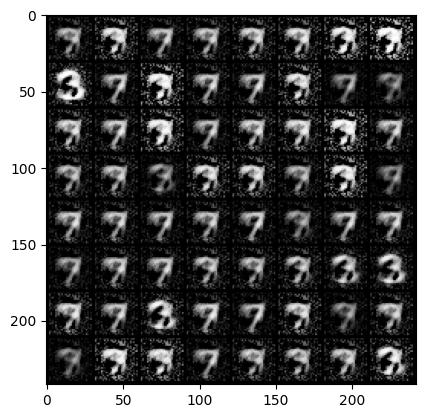

Epoch [36/80] Batch 0/938             Loss D: 0.5524, Loss G: 5.2224
Epoch [36/80] Batch 100/938             Loss D: 0.4121, Loss G: 2.5474
Epoch [36/80] Batch 200/938             Loss D: 0.1328, Loss G: 5.1921
Epoch [36/80] Batch 300/938             Loss D: 0.5152, Loss G: 2.8557
Epoch [36/80] Batch 400/938             Loss D: 0.3440, Loss G: 3.5763
Epoch [36/80] Batch 500/938             Loss D: 0.3993, Loss G: 4.2957
Epoch [36/80] Batch 600/938             Loss D: 0.1924, Loss G: 2.6171
Epoch [36/80] Batch 700/938             Loss D: 0.0868, Loss G: 5.2736
Epoch [36/80] Batch 800/938             Loss D: 0.6288, Loss G: 3.2765
Epoch [36/80] Batch 900/938             Loss D: 0.4354, Loss G: 3.1111


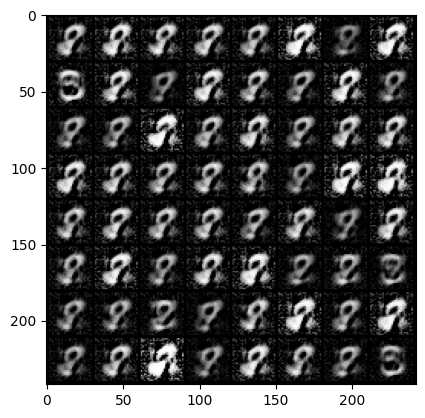

Epoch [37/80] Batch 0/938             Loss D: 0.2910, Loss G: 4.8643
Epoch [37/80] Batch 100/938             Loss D: 0.2930, Loss G: 3.8056
Epoch [37/80] Batch 200/938             Loss D: 0.4555, Loss G: 4.0306
Epoch [37/80] Batch 300/938             Loss D: 0.3191, Loss G: 4.6848
Epoch [37/80] Batch 400/938             Loss D: 0.4206, Loss G: 4.2674
Epoch [37/80] Batch 500/938             Loss D: 0.9649, Loss G: 2.6814
Epoch [37/80] Batch 600/938             Loss D: 0.3743, Loss G: 3.0568
Epoch [37/80] Batch 700/938             Loss D: 0.2149, Loss G: 6.9674
Epoch [37/80] Batch 800/938             Loss D: 0.5623, Loss G: 2.7539
Epoch [37/80] Batch 900/938             Loss D: 0.4278, Loss G: 3.3557


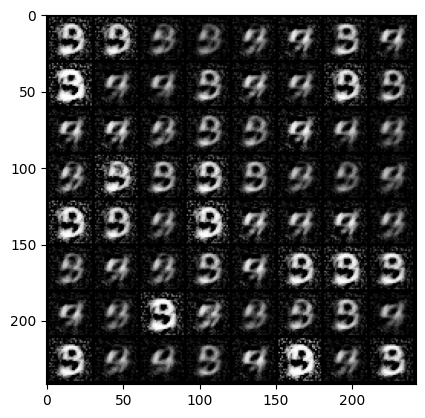

Epoch [38/80] Batch 0/938             Loss D: 0.2324, Loss G: 3.8068
Epoch [38/80] Batch 100/938             Loss D: 0.6818, Loss G: 4.3323
Epoch [38/80] Batch 200/938             Loss D: 0.3845, Loss G: 2.7727
Epoch [38/80] Batch 300/938             Loss D: 0.4380, Loss G: 4.5449
Epoch [38/80] Batch 400/938             Loss D: 0.4529, Loss G: 2.9045
Epoch [38/80] Batch 500/938             Loss D: 0.4792, Loss G: 3.5969
Epoch [38/80] Batch 600/938             Loss D: 0.3926, Loss G: 4.3828
Epoch [38/80] Batch 700/938             Loss D: 0.2372, Loss G: 3.6750
Epoch [38/80] Batch 800/938             Loss D: 0.7362, Loss G: 3.8109
Epoch [38/80] Batch 900/938             Loss D: 0.1258, Loss G: 6.0633


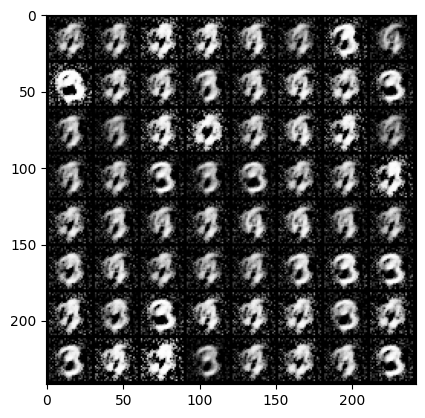

Epoch [39/80] Batch 0/938             Loss D: 0.5859, Loss G: 3.6091
Epoch [39/80] Batch 100/938             Loss D: 0.5137, Loss G: 2.8408
Epoch [39/80] Batch 200/938             Loss D: 0.4313, Loss G: 2.8950
Epoch [39/80] Batch 300/938             Loss D: 0.2396, Loss G: 5.2746
Epoch [39/80] Batch 400/938             Loss D: 0.4031, Loss G: 2.6621
Epoch [39/80] Batch 500/938             Loss D: 0.2886, Loss G: 5.0917
Epoch [39/80] Batch 600/938             Loss D: 0.2790, Loss G: 4.0516
Epoch [39/80] Batch 700/938             Loss D: 0.5889, Loss G: 2.9919
Epoch [39/80] Batch 800/938             Loss D: 0.2321, Loss G: 4.9517
Epoch [39/80] Batch 900/938             Loss D: 0.3308, Loss G: 4.6414


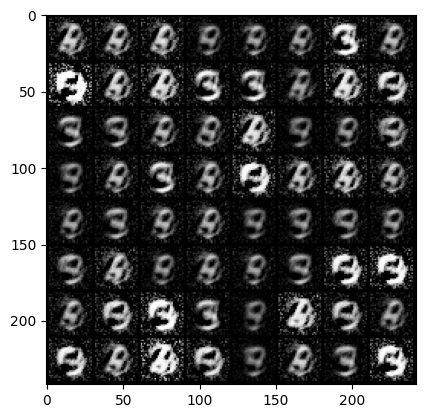

Epoch [40/80] Batch 0/938             Loss D: 0.2857, Loss G: 3.3268
Epoch [40/80] Batch 100/938             Loss D: 0.3253, Loss G: 4.4488
Epoch [40/80] Batch 200/938             Loss D: 0.3395, Loss G: 3.4007
Epoch [40/80] Batch 300/938             Loss D: 0.2120, Loss G: 5.8861
Epoch [40/80] Batch 400/938             Loss D: 0.4679, Loss G: 3.8503
Epoch [40/80] Batch 500/938             Loss D: 0.4845, Loss G: 3.4147
Epoch [40/80] Batch 600/938             Loss D: 0.5564, Loss G: 4.1863
Epoch [40/80] Batch 700/938             Loss D: 0.7552, Loss G: 3.7995
Epoch [40/80] Batch 800/938             Loss D: 0.5363, Loss G: 3.6248
Epoch [40/80] Batch 900/938             Loss D: 0.1467, Loss G: 3.5743


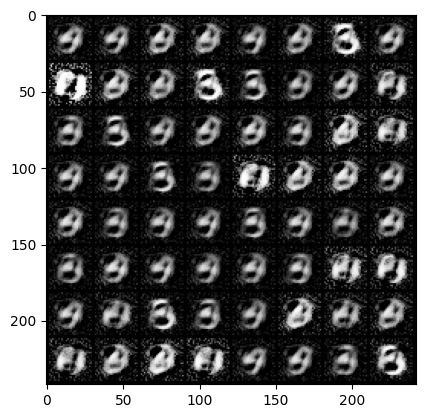

Epoch [41/80] Batch 0/938             Loss D: 0.4623, Loss G: 3.9744
Epoch [41/80] Batch 100/938             Loss D: 0.5405, Loss G: 3.8936
Epoch [41/80] Batch 200/938             Loss D: 0.3658, Loss G: 2.9832
Epoch [41/80] Batch 300/938             Loss D: 0.2965, Loss G: 5.1048
Epoch [41/80] Batch 400/938             Loss D: 0.4441, Loss G: 4.8517
Epoch [41/80] Batch 500/938             Loss D: 0.5684, Loss G: 2.9655
Epoch [41/80] Batch 600/938             Loss D: 0.2211, Loss G: 3.3114
Epoch [41/80] Batch 700/938             Loss D: 0.2568, Loss G: 4.3844
Epoch [41/80] Batch 800/938             Loss D: 0.4575, Loss G: 3.3927
Epoch [41/80] Batch 900/938             Loss D: 0.6065, Loss G: 3.3644


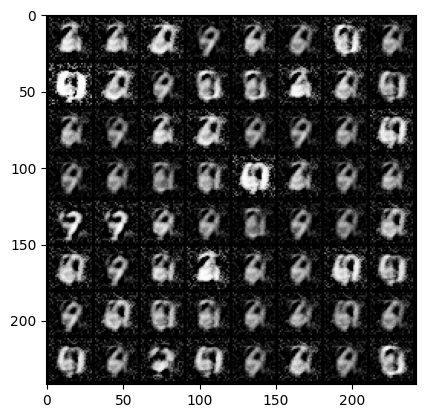

Epoch [42/80] Batch 0/938             Loss D: 0.3535, Loss G: 4.2313
Epoch [42/80] Batch 100/938             Loss D: 0.2374, Loss G: 6.8564
Epoch [42/80] Batch 200/938             Loss D: 0.2345, Loss G: 3.9425
Epoch [42/80] Batch 300/938             Loss D: 0.2156, Loss G: 4.9316
Epoch [42/80] Batch 400/938             Loss D: 0.2842, Loss G: 3.7797
Epoch [42/80] Batch 500/938             Loss D: 0.5833, Loss G: 4.3376
Epoch [42/80] Batch 600/938             Loss D: 0.4503, Loss G: 4.0407
Epoch [42/80] Batch 700/938             Loss D: 0.5328, Loss G: 5.0259
Epoch [42/80] Batch 800/938             Loss D: 0.0999, Loss G: 4.2561
Epoch [42/80] Batch 900/938             Loss D: 0.2775, Loss G: 4.6899


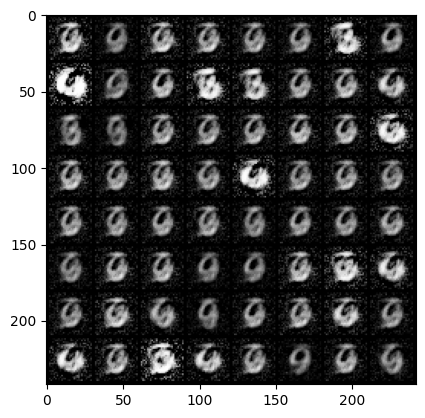

Epoch [43/80] Batch 0/938             Loss D: 0.3830, Loss G: 3.5209
Epoch [43/80] Batch 100/938             Loss D: 0.3424, Loss G: 5.0857
Epoch [43/80] Batch 200/938             Loss D: 0.2334, Loss G: 3.3012
Epoch [43/80] Batch 300/938             Loss D: 0.0914, Loss G: 3.9352
Epoch [43/80] Batch 400/938             Loss D: 0.1916, Loss G: 6.6766
Epoch [43/80] Batch 500/938             Loss D: 0.2986, Loss G: 4.8041
Epoch [43/80] Batch 600/938             Loss D: 0.3171, Loss G: 5.0621
Epoch [43/80] Batch 700/938             Loss D: 0.4995, Loss G: 5.5349
Epoch [43/80] Batch 800/938             Loss D: 0.2178, Loss G: 4.4671
Epoch [43/80] Batch 900/938             Loss D: 0.3634, Loss G: 3.8444


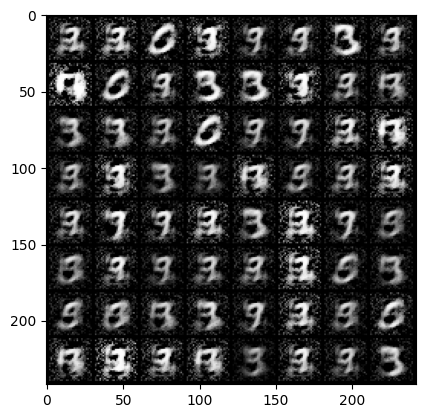

Epoch [44/80] Batch 0/938             Loss D: 0.4322, Loss G: 5.0077
Epoch [44/80] Batch 100/938             Loss D: 0.3866, Loss G: 3.9490
Epoch [44/80] Batch 200/938             Loss D: 0.3817, Loss G: 3.5350
Epoch [44/80] Batch 300/938             Loss D: 0.3414, Loss G: 3.9199
Epoch [44/80] Batch 400/938             Loss D: 0.1818, Loss G: 4.1939
Epoch [44/80] Batch 500/938             Loss D: 0.1531, Loss G: 6.2253
Epoch [44/80] Batch 600/938             Loss D: 0.3367, Loss G: 4.8196
Epoch [44/80] Batch 700/938             Loss D: 0.2704, Loss G: 3.7324
Epoch [44/80] Batch 800/938             Loss D: 0.5051, Loss G: 4.6436
Epoch [44/80] Batch 900/938             Loss D: 0.5005, Loss G: 4.0986


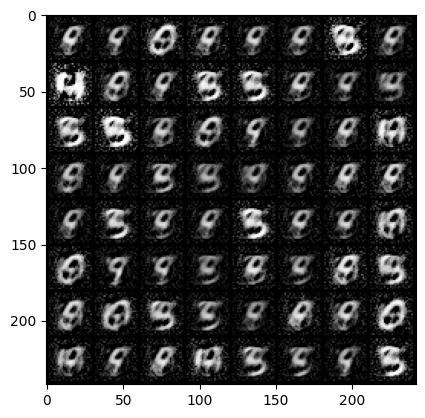

Epoch [45/80] Batch 0/938             Loss D: 0.2581, Loss G: 3.5912
Epoch [45/80] Batch 100/938             Loss D: 0.5391, Loss G: 4.4542
Epoch [45/80] Batch 200/938             Loss D: 0.4281, Loss G: 2.4764
Epoch [45/80] Batch 300/938             Loss D: 0.5906, Loss G: 3.5028
Epoch [45/80] Batch 400/938             Loss D: 0.4393, Loss G: 4.2326
Epoch [45/80] Batch 500/938             Loss D: 0.2440, Loss G: 3.7422
Epoch [45/80] Batch 600/938             Loss D: 0.4144, Loss G: 3.3620
Epoch [45/80] Batch 700/938             Loss D: 0.1813, Loss G: 4.1587
Epoch [45/80] Batch 800/938             Loss D: 0.6810, Loss G: 3.3059
Epoch [45/80] Batch 900/938             Loss D: 0.5894, Loss G: 4.6750


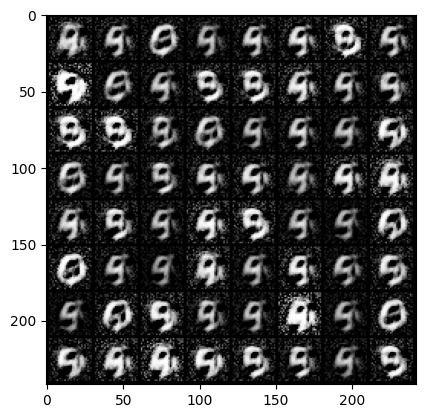

Epoch [46/80] Batch 0/938             Loss D: 0.5893, Loss G: 3.5490
Epoch [46/80] Batch 100/938             Loss D: 0.3178, Loss G: 3.9540
Epoch [46/80] Batch 200/938             Loss D: 0.3056, Loss G: 3.2140
Epoch [46/80] Batch 300/938             Loss D: 0.4021, Loss G: 5.7814
Epoch [46/80] Batch 400/938             Loss D: 0.5162, Loss G: 3.3217
Epoch [46/80] Batch 500/938             Loss D: 0.3938, Loss G: 4.4947
Epoch [46/80] Batch 600/938             Loss D: 0.0920, Loss G: 4.1435
Epoch [46/80] Batch 700/938             Loss D: 0.2136, Loss G: 3.8254
Epoch [46/80] Batch 800/938             Loss D: 0.2582, Loss G: 4.2753
Epoch [46/80] Batch 900/938             Loss D: 0.4493, Loss G: 4.0258


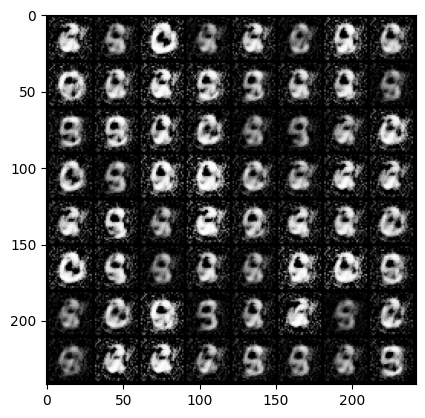

Epoch [47/80] Batch 0/938             Loss D: 0.3317, Loss G: 4.6915
Epoch [47/80] Batch 100/938             Loss D: 0.5249, Loss G: 3.9544
Epoch [47/80] Batch 200/938             Loss D: 0.2432, Loss G: 3.8830
Epoch [47/80] Batch 300/938             Loss D: 0.3317, Loss G: 5.0847
Epoch [47/80] Batch 400/938             Loss D: 0.5669, Loss G: 2.8965
Epoch [47/80] Batch 500/938             Loss D: 0.2827, Loss G: 5.6555
Epoch [47/80] Batch 600/938             Loss D: 0.3237, Loss G: 4.6315
Epoch [47/80] Batch 700/938             Loss D: 0.5321, Loss G: 3.7704
Epoch [47/80] Batch 800/938             Loss D: 0.1375, Loss G: 3.9612
Epoch [47/80] Batch 900/938             Loss D: 0.3069, Loss G: 4.1936


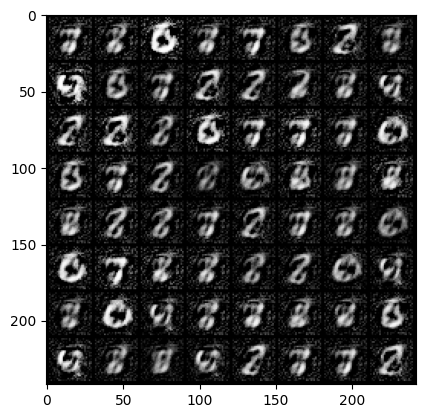

Epoch [48/80] Batch 0/938             Loss D: 0.2576, Loss G: 4.1077
Epoch [48/80] Batch 100/938             Loss D: 0.2244, Loss G: 4.1139
Epoch [48/80] Batch 200/938             Loss D: 0.5058, Loss G: 4.3537
Epoch [48/80] Batch 300/938             Loss D: 0.1741, Loss G: 4.6349
Epoch [48/80] Batch 400/938             Loss D: 0.2849, Loss G: 3.5742
Epoch [48/80] Batch 500/938             Loss D: 0.2774, Loss G: 3.8764
Epoch [48/80] Batch 600/938             Loss D: 0.2877, Loss G: 4.2609
Epoch [48/80] Batch 700/938             Loss D: 0.2149, Loss G: 5.1987
Epoch [48/80] Batch 800/938             Loss D: 0.4011, Loss G: 3.4521
Epoch [48/80] Batch 900/938             Loss D: 0.1555, Loss G: 4.3486


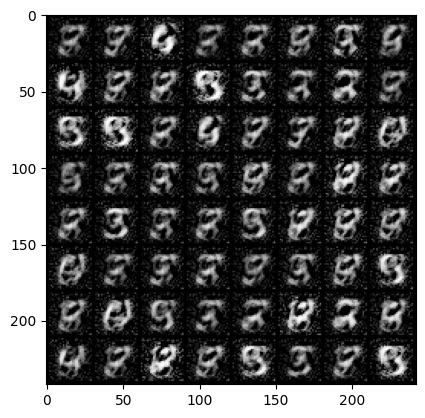

Epoch [49/80] Batch 0/938             Loss D: 0.2468, Loss G: 4.5274
Epoch [49/80] Batch 100/938             Loss D: 0.2043, Loss G: 3.1633
Epoch [49/80] Batch 200/938             Loss D: 0.4120, Loss G: 4.0557
Epoch [49/80] Batch 300/938             Loss D: 0.3975, Loss G: 4.2391
Epoch [49/80] Batch 400/938             Loss D: 0.5402, Loss G: 3.8068
Epoch [49/80] Batch 500/938             Loss D: 0.2048, Loss G: 3.9668
Epoch [49/80] Batch 600/938             Loss D: 0.4844, Loss G: 3.9654
Epoch [49/80] Batch 700/938             Loss D: 0.4339, Loss G: 4.1251
Epoch [49/80] Batch 800/938             Loss D: 0.1993, Loss G: 3.1885
Epoch [49/80] Batch 900/938             Loss D: 0.3398, Loss G: 4.7015


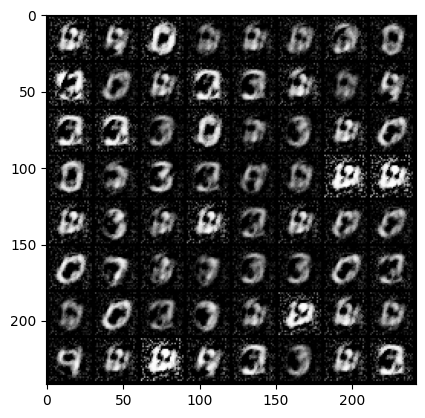

Epoch [50/80] Batch 0/938             Loss D: 0.2113, Loss G: 3.8310
Epoch [50/80] Batch 100/938             Loss D: 0.4188, Loss G: 4.6635
Epoch [50/80] Batch 200/938             Loss D: 0.1721, Loss G: 5.1769
Epoch [50/80] Batch 300/938             Loss D: 0.3246, Loss G: 3.4004
Epoch [50/80] Batch 400/938             Loss D: 0.3635, Loss G: 4.1842
Epoch [50/80] Batch 500/938             Loss D: 0.3633, Loss G: 5.1192
Epoch [50/80] Batch 600/938             Loss D: 0.2769, Loss G: 3.7752
Epoch [50/80] Batch 700/938             Loss D: 0.1507, Loss G: 4.4726
Epoch [50/80] Batch 800/938             Loss D: 0.2994, Loss G: 4.4963
Epoch [50/80] Batch 900/938             Loss D: 0.5073, Loss G: 3.6134


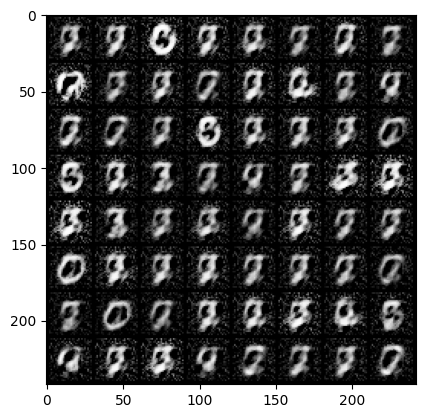

Epoch [51/80] Batch 0/938             Loss D: 0.1810, Loss G: 4.0094
Epoch [51/80] Batch 100/938             Loss D: 0.4496, Loss G: 2.9375
Epoch [51/80] Batch 200/938             Loss D: 0.2490, Loss G: 3.9392
Epoch [51/80] Batch 300/938             Loss D: 0.1975, Loss G: 3.9395
Epoch [51/80] Batch 400/938             Loss D: 0.4998, Loss G: 3.9178
Epoch [51/80] Batch 500/938             Loss D: 0.2290, Loss G: 4.9332
Epoch [51/80] Batch 600/938             Loss D: 0.2152, Loss G: 3.8425
Epoch [51/80] Batch 700/938             Loss D: 0.2420, Loss G: 3.4505
Epoch [51/80] Batch 800/938             Loss D: 0.2547, Loss G: 4.1547
Epoch [51/80] Batch 900/938             Loss D: 0.3948, Loss G: 3.6557


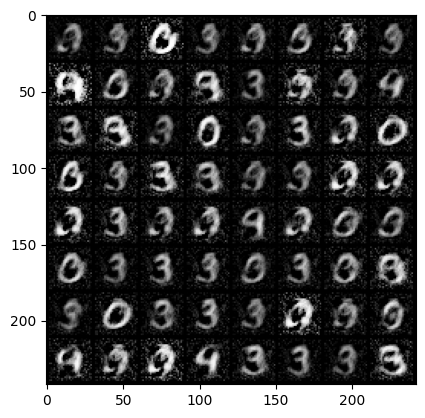

Epoch [52/80] Batch 0/938             Loss D: 0.2222, Loss G: 4.6485
Epoch [52/80] Batch 100/938             Loss D: 0.1681, Loss G: 4.2937
Epoch [52/80] Batch 200/938             Loss D: 0.3095, Loss G: 3.2199
Epoch [52/80] Batch 300/938             Loss D: 0.3159, Loss G: 4.2856
Epoch [52/80] Batch 400/938             Loss D: 0.3145, Loss G: 3.6590
Epoch [52/80] Batch 500/938             Loss D: 0.4420, Loss G: 3.8875
Epoch [52/80] Batch 600/938             Loss D: 0.3535, Loss G: 3.8459
Epoch [52/80] Batch 700/938             Loss D: 0.2570, Loss G: 5.1011
Epoch [52/80] Batch 800/938             Loss D: 0.3404, Loss G: 3.4832
Epoch [52/80] Batch 900/938             Loss D: 0.5463, Loss G: 3.6723


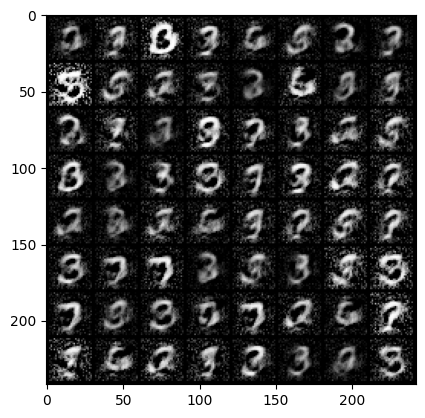

Epoch [53/80] Batch 0/938             Loss D: 0.2744, Loss G: 3.7728
Epoch [53/80] Batch 100/938             Loss D: 0.3972, Loss G: 4.4258
Epoch [53/80] Batch 200/938             Loss D: 0.3888, Loss G: 3.6299
Epoch [53/80] Batch 300/938             Loss D: 0.3079, Loss G: 4.3367
Epoch [53/80] Batch 400/938             Loss D: 0.5019, Loss G: 4.6149
Epoch [53/80] Batch 500/938             Loss D: 0.2117, Loss G: 3.9023
Epoch [53/80] Batch 600/938             Loss D: 0.2976, Loss G: 4.0240
Epoch [53/80] Batch 700/938             Loss D: 0.2282, Loss G: 3.1121
Epoch [53/80] Batch 800/938             Loss D: 0.3357, Loss G: 4.5130
Epoch [53/80] Batch 900/938             Loss D: 0.6352, Loss G: 3.5927


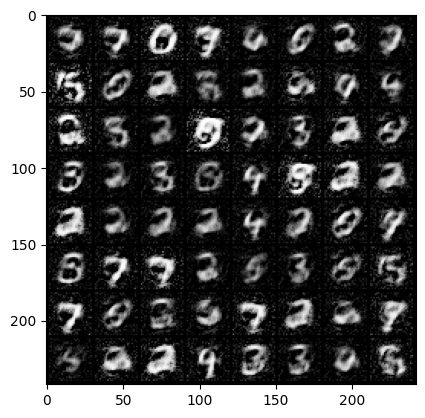

Epoch [54/80] Batch 0/938             Loss D: 0.3466, Loss G: 3.6079
Epoch [54/80] Batch 100/938             Loss D: 0.2342, Loss G: 3.7241
Epoch [54/80] Batch 200/938             Loss D: 0.4472, Loss G: 4.6189
Epoch [54/80] Batch 300/938             Loss D: 0.3108, Loss G: 5.1472
Epoch [54/80] Batch 400/938             Loss D: 0.3109, Loss G: 3.8980
Epoch [54/80] Batch 500/938             Loss D: 0.4607, Loss G: 4.2509
Epoch [54/80] Batch 600/938             Loss D: 0.4056, Loss G: 3.4053
Epoch [54/80] Batch 700/938             Loss D: 0.3655, Loss G: 3.6498
Epoch [54/80] Batch 800/938             Loss D: 0.4257, Loss G: 3.7479
Epoch [54/80] Batch 900/938             Loss D: 0.1622, Loss G: 4.3616


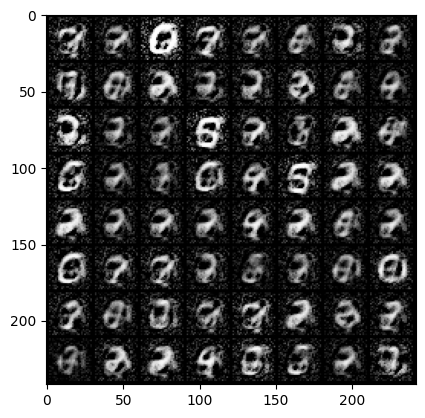

Epoch [55/80] Batch 0/938             Loss D: 0.4261, Loss G: 4.5988
Epoch [55/80] Batch 100/938             Loss D: 0.3287, Loss G: 4.5188
Epoch [55/80] Batch 200/938             Loss D: 0.3409, Loss G: 4.7447
Epoch [55/80] Batch 300/938             Loss D: 0.3154, Loss G: 2.9863
Epoch [55/80] Batch 400/938             Loss D: 0.2024, Loss G: 3.8667
Epoch [55/80] Batch 500/938             Loss D: 0.3453, Loss G: 3.4494
Epoch [55/80] Batch 600/938             Loss D: 0.4727, Loss G: 4.0296
Epoch [55/80] Batch 700/938             Loss D: 0.2689, Loss G: 4.4050
Epoch [55/80] Batch 800/938             Loss D: 0.3460, Loss G: 3.7512
Epoch [55/80] Batch 900/938             Loss D: 0.1370, Loss G: 4.7173


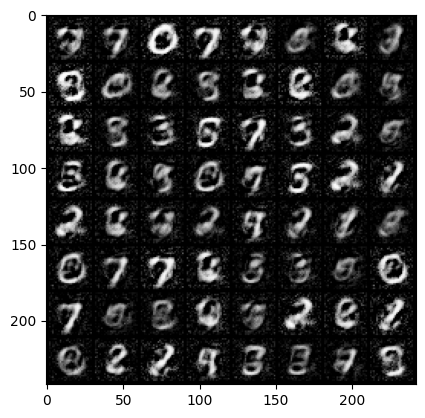

Epoch [56/80] Batch 0/938             Loss D: 0.3242, Loss G: 4.3109
Epoch [56/80] Batch 100/938             Loss D: 0.2331, Loss G: 4.0089
Epoch [56/80] Batch 200/938             Loss D: 0.3326, Loss G: 3.9174
Epoch [56/80] Batch 300/938             Loss D: 0.2785, Loss G: 3.8545
Epoch [56/80] Batch 400/938             Loss D: 0.3697, Loss G: 4.0569
Epoch [56/80] Batch 500/938             Loss D: 0.3368, Loss G: 4.6866
Epoch [56/80] Batch 600/938             Loss D: 0.2968, Loss G: 4.1595
Epoch [56/80] Batch 700/938             Loss D: 0.5085, Loss G: 3.6321
Epoch [56/80] Batch 800/938             Loss D: 0.5078, Loss G: 3.0990
Epoch [56/80] Batch 900/938             Loss D: 0.3966, Loss G: 3.5976


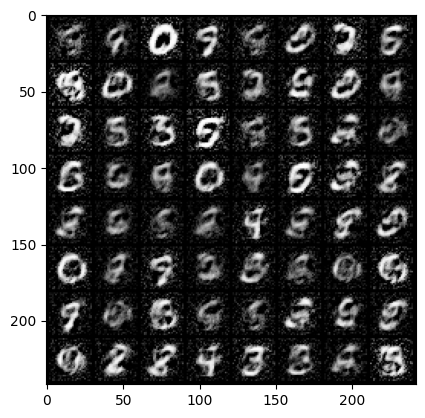

Epoch [57/80] Batch 0/938             Loss D: 0.3372, Loss G: 3.6851
Epoch [57/80] Batch 100/938             Loss D: 0.3414, Loss G: 3.3963
Epoch [57/80] Batch 200/938             Loss D: 0.3116, Loss G: 3.4345
Epoch [57/80] Batch 300/938             Loss D: 0.2666, Loss G: 3.5720
Epoch [57/80] Batch 400/938             Loss D: 0.3123, Loss G: 3.8518
Epoch [57/80] Batch 500/938             Loss D: 0.5605, Loss G: 3.7230
Epoch [57/80] Batch 600/938             Loss D: 0.3724, Loss G: 3.7411
Epoch [57/80] Batch 700/938             Loss D: 0.4637, Loss G: 4.5037
Epoch [57/80] Batch 800/938             Loss D: 0.3696, Loss G: 3.8496
Epoch [57/80] Batch 900/938             Loss D: 0.2584, Loss G: 4.6729


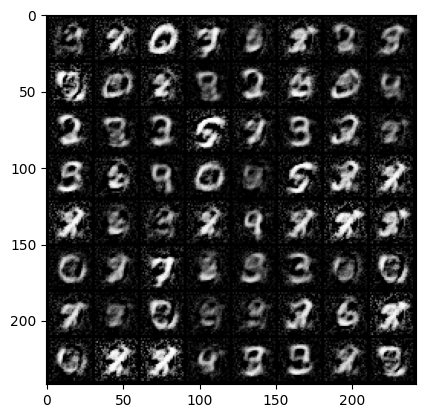

Epoch [58/80] Batch 0/938             Loss D: 0.5167, Loss G: 3.1047
Epoch [58/80] Batch 100/938             Loss D: 0.2962, Loss G: 3.6786
Epoch [58/80] Batch 200/938             Loss D: 0.4277, Loss G: 3.4970
Epoch [58/80] Batch 300/938             Loss D: 0.2629, Loss G: 3.6453
Epoch [58/80] Batch 400/938             Loss D: 0.3494, Loss G: 3.7731
Epoch [58/80] Batch 500/938             Loss D: 0.3878, Loss G: 4.5216
Epoch [58/80] Batch 600/938             Loss D: 0.2502, Loss G: 3.0103
Epoch [58/80] Batch 700/938             Loss D: 0.1519, Loss G: 4.3806
Epoch [58/80] Batch 800/938             Loss D: 0.2119, Loss G: 3.9971
Epoch [58/80] Batch 900/938             Loss D: 0.2417, Loss G: 3.7341


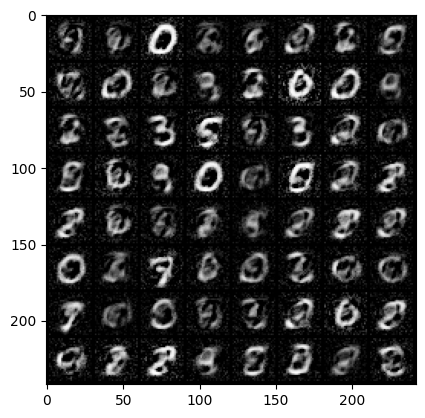

Epoch [59/80] Batch 0/938             Loss D: 0.5159, Loss G: 3.5989
Epoch [59/80] Batch 100/938             Loss D: 0.3623, Loss G: 3.3759
Epoch [59/80] Batch 200/938             Loss D: 0.2430, Loss G: 3.3668
Epoch [59/80] Batch 300/938             Loss D: 0.5105, Loss G: 4.3157
Epoch [59/80] Batch 400/938             Loss D: 0.1452, Loss G: 4.6219
Epoch [59/80] Batch 500/938             Loss D: 0.2603, Loss G: 4.0506
Epoch [59/80] Batch 600/938             Loss D: 0.1990, Loss G: 3.9183
Epoch [59/80] Batch 700/938             Loss D: 0.3248, Loss G: 4.1939
Epoch [59/80] Batch 800/938             Loss D: 0.3138, Loss G: 3.9725
Epoch [59/80] Batch 900/938             Loss D: 0.3176, Loss G: 4.4300


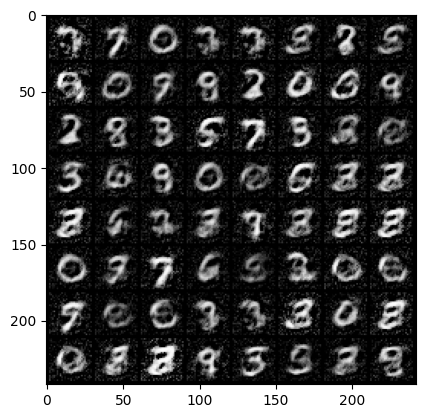

Epoch [60/80] Batch 0/938             Loss D: 0.2921, Loss G: 4.0795
Epoch [60/80] Batch 100/938             Loss D: 0.3732, Loss G: 3.4136
Epoch [60/80] Batch 200/938             Loss D: 0.1917, Loss G: 3.9042
Epoch [60/80] Batch 300/938             Loss D: 0.5415, Loss G: 4.6008
Epoch [60/80] Batch 400/938             Loss D: 0.1753, Loss G: 4.8338
Epoch [60/80] Batch 500/938             Loss D: 0.3319, Loss G: 4.2061
Epoch [60/80] Batch 600/938             Loss D: 0.1114, Loss G: 4.5400
Epoch [60/80] Batch 700/938             Loss D: 0.2392, Loss G: 4.5363
Epoch [60/80] Batch 800/938             Loss D: 0.2769, Loss G: 3.8395
Epoch [60/80] Batch 900/938             Loss D: 0.1875, Loss G: 4.3331


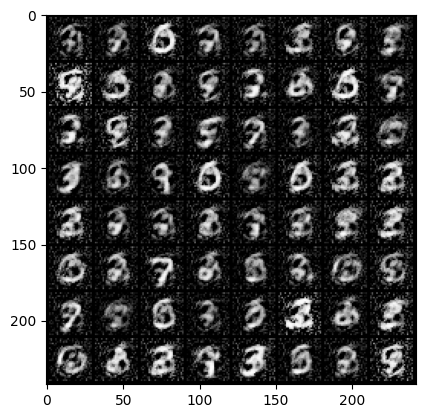

Epoch [61/80] Batch 0/938             Loss D: 0.2256, Loss G: 5.5083
Epoch [61/80] Batch 100/938             Loss D: 0.4408, Loss G: 2.9745
Epoch [61/80] Batch 200/938             Loss D: 0.4053, Loss G: 4.2527
Epoch [61/80] Batch 300/938             Loss D: 0.2282, Loss G: 3.7642
Epoch [61/80] Batch 400/938             Loss D: 0.3783, Loss G: 3.5605
Epoch [61/80] Batch 500/938             Loss D: 0.2873, Loss G: 4.7785
Epoch [61/80] Batch 600/938             Loss D: 0.3084, Loss G: 3.7042
Epoch [61/80] Batch 700/938             Loss D: 0.4958, Loss G: 3.6663
Epoch [61/80] Batch 800/938             Loss D: 0.1404, Loss G: 4.1432
Epoch [61/80] Batch 900/938             Loss D: 0.2452, Loss G: 2.8332


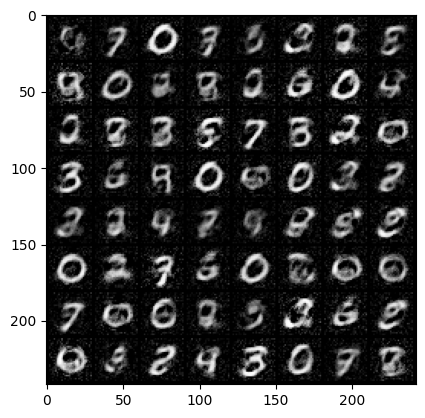

Epoch [62/80] Batch 0/938             Loss D: 0.2981, Loss G: 3.5533
Epoch [62/80] Batch 100/938             Loss D: 0.2760, Loss G: 4.6746
Epoch [62/80] Batch 200/938             Loss D: 0.4400, Loss G: 3.5888
Epoch [62/80] Batch 300/938             Loss D: 0.7073, Loss G: 4.0527
Epoch [62/80] Batch 400/938             Loss D: 0.2430, Loss G: 4.2377
Epoch [62/80] Batch 500/938             Loss D: 0.4948, Loss G: 3.1555
Epoch [62/80] Batch 600/938             Loss D: 0.1775, Loss G: 4.4515
Epoch [62/80] Batch 700/938             Loss D: 0.2404, Loss G: 3.8784
Epoch [62/80] Batch 800/938             Loss D: 0.4723, Loss G: 3.6354
Epoch [62/80] Batch 900/938             Loss D: 0.3354, Loss G: 3.5719


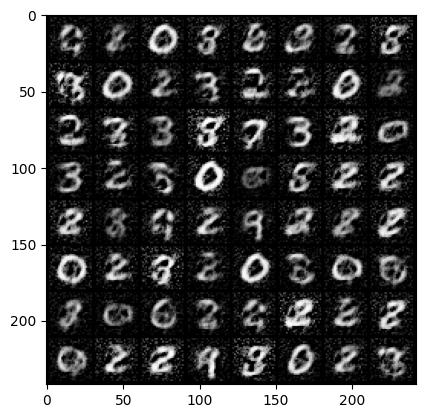

Epoch [63/80] Batch 0/938             Loss D: 0.2263, Loss G: 4.3531
Epoch [63/80] Batch 100/938             Loss D: 0.2389, Loss G: 4.3316
Epoch [63/80] Batch 200/938             Loss D: 0.2112, Loss G: 3.9200
Epoch [63/80] Batch 300/938             Loss D: 0.2074, Loss G: 4.1673
Epoch [63/80] Batch 400/938             Loss D: 0.2077, Loss G: 3.9103
Epoch [63/80] Batch 500/938             Loss D: 0.2974, Loss G: 4.1250
Epoch [63/80] Batch 600/938             Loss D: 0.1995, Loss G: 3.8990
Epoch [63/80] Batch 700/938             Loss D: 0.4721, Loss G: 4.2494
Epoch [63/80] Batch 800/938             Loss D: 0.2625, Loss G: 4.4065
Epoch [63/80] Batch 900/938             Loss D: 0.5125, Loss G: 4.6582


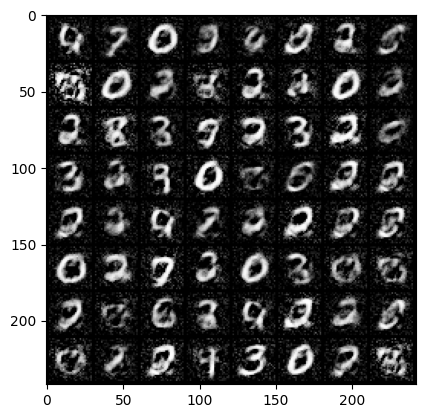

Epoch [64/80] Batch 0/938             Loss D: 0.2945, Loss G: 4.1085
Epoch [64/80] Batch 100/938             Loss D: 0.2738, Loss G: 3.5275
Epoch [64/80] Batch 200/938             Loss D: 0.3059, Loss G: 4.0295
Epoch [64/80] Batch 300/938             Loss D: 0.3622, Loss G: 3.5929
Epoch [64/80] Batch 400/938             Loss D: 0.4081, Loss G: 3.7435
Epoch [64/80] Batch 500/938             Loss D: 0.2364, Loss G: 3.8434
Epoch [64/80] Batch 600/938             Loss D: 0.3086, Loss G: 4.0020
Epoch [64/80] Batch 700/938             Loss D: 0.2336, Loss G: 4.3149
Epoch [64/80] Batch 800/938             Loss D: 0.1859, Loss G: 4.8428
Epoch [64/80] Batch 900/938             Loss D: 0.1511, Loss G: 4.2517


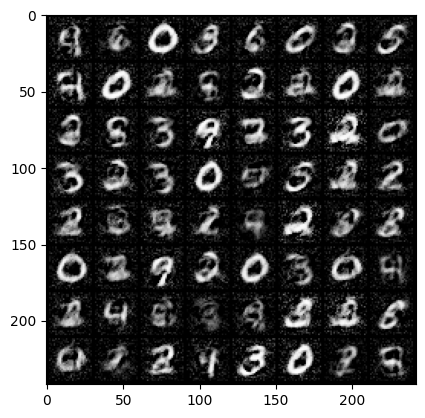

Epoch [65/80] Batch 0/938             Loss D: 0.1830, Loss G: 4.6648
Epoch [65/80] Batch 100/938             Loss D: 0.4121, Loss G: 3.4602
Epoch [65/80] Batch 200/938             Loss D: 0.3596, Loss G: 3.5918
Epoch [65/80] Batch 300/938             Loss D: 0.4363, Loss G: 3.9989
Epoch [65/80] Batch 400/938             Loss D: 0.2408, Loss G: 4.1439
Epoch [65/80] Batch 500/938             Loss D: 0.2740, Loss G: 3.7450
Epoch [65/80] Batch 600/938             Loss D: 0.2792, Loss G: 3.5012
Epoch [65/80] Batch 700/938             Loss D: 0.2318, Loss G: 3.7339
Epoch [65/80] Batch 800/938             Loss D: 0.2131, Loss G: 4.8847
Epoch [65/80] Batch 900/938             Loss D: 0.3345, Loss G: 3.6387


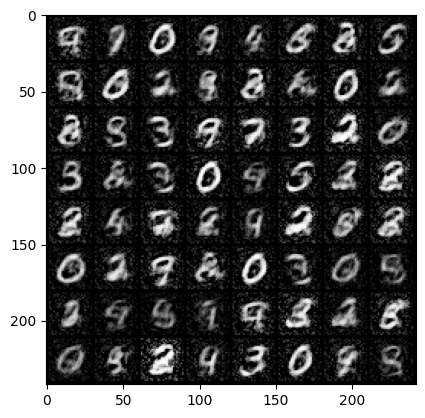

Epoch [66/80] Batch 0/938             Loss D: 0.4564, Loss G: 3.6296
Epoch [66/80] Batch 100/938             Loss D: 0.3602, Loss G: 4.3959
Epoch [66/80] Batch 200/938             Loss D: 0.2876, Loss G: 4.4599
Epoch [66/80] Batch 300/938             Loss D: 0.3587, Loss G: 4.9804
Epoch [66/80] Batch 400/938             Loss D: 0.6341, Loss G: 4.1235
Epoch [66/80] Batch 500/938             Loss D: 0.2960, Loss G: 3.6942
Epoch [66/80] Batch 600/938             Loss D: 0.2827, Loss G: 3.3191
Epoch [66/80] Batch 700/938             Loss D: 0.3848, Loss G: 4.0879
Epoch [66/80] Batch 800/938             Loss D: 0.0908, Loss G: 4.3537
Epoch [66/80] Batch 900/938             Loss D: 0.3637, Loss G: 3.7410


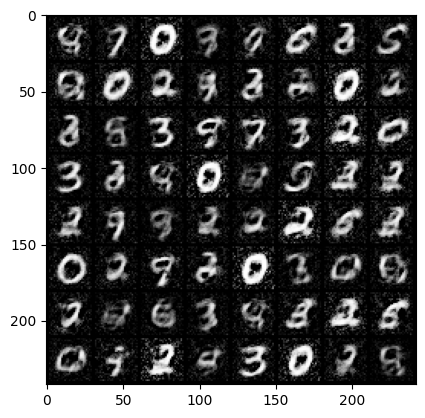

Epoch [67/80] Batch 0/938             Loss D: 0.3332, Loss G: 3.9893
Epoch [67/80] Batch 100/938             Loss D: 0.2757, Loss G: 4.7036
Epoch [67/80] Batch 200/938             Loss D: 0.3003, Loss G: 3.4990
Epoch [67/80] Batch 300/938             Loss D: 0.3078, Loss G: 3.8786
Epoch [67/80] Batch 400/938             Loss D: 0.3951, Loss G: 3.9179
Epoch [67/80] Batch 500/938             Loss D: 0.4265, Loss G: 4.5177
Epoch [67/80] Batch 600/938             Loss D: 0.1438, Loss G: 4.9786
Epoch [67/80] Batch 700/938             Loss D: 0.3148, Loss G: 3.9686
Epoch [67/80] Batch 800/938             Loss D: 0.2382, Loss G: 3.7833
Epoch [67/80] Batch 900/938             Loss D: 0.2260, Loss G: 3.5012


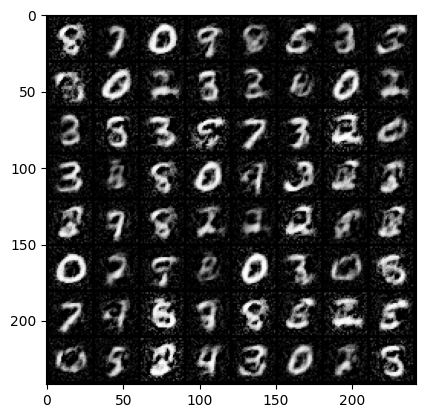

Epoch [68/80] Batch 0/938             Loss D: 0.3349, Loss G: 4.0805
Epoch [68/80] Batch 100/938             Loss D: 0.2046, Loss G: 3.3503
Epoch [68/80] Batch 200/938             Loss D: 0.1024, Loss G: 4.1653
Epoch [68/80] Batch 300/938             Loss D: 0.2890, Loss G: 4.1221
Epoch [68/80] Batch 400/938             Loss D: 0.4267, Loss G: 4.4141
Epoch [68/80] Batch 500/938             Loss D: 0.3241, Loss G: 3.7768
Epoch [68/80] Batch 600/938             Loss D: 0.3392, Loss G: 3.7510
Epoch [68/80] Batch 700/938             Loss D: 0.1541, Loss G: 4.7635
Epoch [68/80] Batch 800/938             Loss D: 0.3017, Loss G: 3.8327
Epoch [68/80] Batch 900/938             Loss D: 0.5034, Loss G: 3.8503


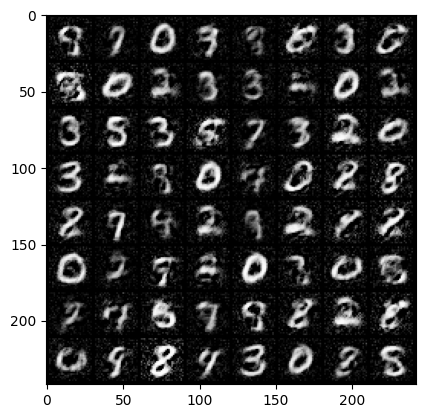

Epoch [69/80] Batch 0/938             Loss D: 0.2222, Loss G: 4.2592
Epoch [69/80] Batch 100/938             Loss D: 0.4479, Loss G: 3.3837
Epoch [69/80] Batch 200/938             Loss D: 0.2741, Loss G: 3.7876
Epoch [69/80] Batch 300/938             Loss D: 0.4096, Loss G: 4.1250
Epoch [69/80] Batch 400/938             Loss D: 0.3794, Loss G: 4.0885
Epoch [69/80] Batch 500/938             Loss D: 0.2403, Loss G: 3.9327
Epoch [69/80] Batch 600/938             Loss D: 0.3326, Loss G: 3.9176
Epoch [69/80] Batch 700/938             Loss D: 0.3168, Loss G: 4.1158
Epoch [69/80] Batch 800/938             Loss D: 0.2792, Loss G: 3.7217
Epoch [69/80] Batch 900/938             Loss D: 0.1630, Loss G: 3.9253


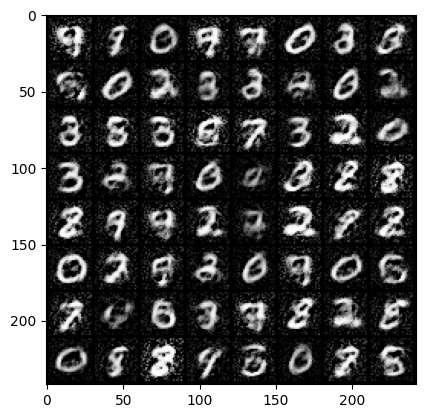

Epoch [70/80] Batch 0/938             Loss D: 0.2382, Loss G: 3.7830
Epoch [70/80] Batch 100/938             Loss D: 0.3425, Loss G: 4.6299
Epoch [70/80] Batch 200/938             Loss D: 0.3884, Loss G: 4.5403
Epoch [70/80] Batch 300/938             Loss D: 0.2857, Loss G: 3.6725
Epoch [70/80] Batch 400/938             Loss D: 0.2089, Loss G: 3.8823
Epoch [70/80] Batch 500/938             Loss D: 0.5221, Loss G: 4.4907
Epoch [70/80] Batch 600/938             Loss D: 0.2959, Loss G: 4.3517
Epoch [70/80] Batch 700/938             Loss D: 0.1656, Loss G: 4.4011
Epoch [70/80] Batch 800/938             Loss D: 0.2875, Loss G: 3.6313
Epoch [70/80] Batch 900/938             Loss D: 0.2801, Loss G: 4.0602


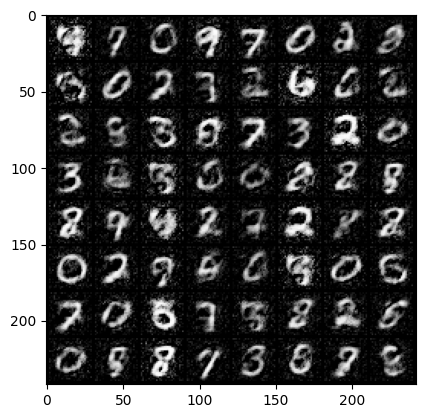

Epoch [71/80] Batch 0/938             Loss D: 0.2953, Loss G: 4.1667
Epoch [71/80] Batch 100/938             Loss D: 0.2504, Loss G: 3.3458
Epoch [71/80] Batch 200/938             Loss D: 0.2831, Loss G: 4.2495
Epoch [71/80] Batch 300/938             Loss D: 0.3135, Loss G: 3.9417
Epoch [71/80] Batch 400/938             Loss D: 0.1865, Loss G: 4.0853
Epoch [71/80] Batch 500/938             Loss D: 0.2316, Loss G: 4.3851
Epoch [71/80] Batch 600/938             Loss D: 0.5266, Loss G: 4.3164
Epoch [71/80] Batch 700/938             Loss D: 0.1884, Loss G: 4.0895
Epoch [71/80] Batch 800/938             Loss D: 0.3669, Loss G: 4.6663
Epoch [71/80] Batch 900/938             Loss D: 0.2564, Loss G: 3.6392


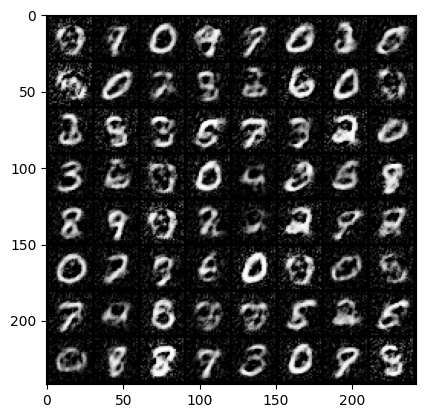

Epoch [72/80] Batch 0/938             Loss D: 0.3444, Loss G: 3.8336
Epoch [72/80] Batch 100/938             Loss D: 0.4032, Loss G: 4.0927
Epoch [72/80] Batch 200/938             Loss D: 0.3351, Loss G: 4.1955
Epoch [72/80] Batch 300/938             Loss D: 0.3361, Loss G: 4.2513
Epoch [72/80] Batch 400/938             Loss D: 0.3285, Loss G: 4.1504
Epoch [72/80] Batch 500/938             Loss D: 0.3957, Loss G: 4.7161
Epoch [72/80] Batch 600/938             Loss D: 0.4158, Loss G: 3.7969
Epoch [72/80] Batch 700/938             Loss D: 0.2130, Loss G: 3.6116
Epoch [72/80] Batch 800/938             Loss D: 0.2865, Loss G: 3.8836
Epoch [72/80] Batch 900/938             Loss D: 0.2525, Loss G: 3.4585


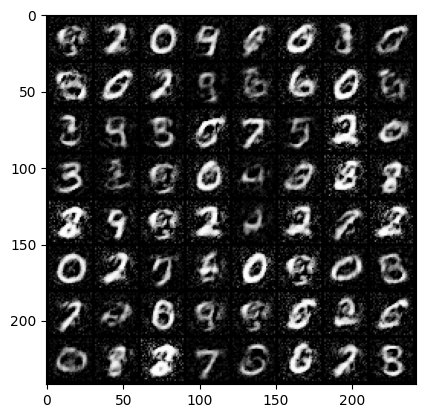

Epoch [73/80] Batch 0/938             Loss D: 0.3385, Loss G: 4.4933
Epoch [73/80] Batch 100/938             Loss D: 0.2130, Loss G: 4.3257
Epoch [73/80] Batch 200/938             Loss D: 0.2310, Loss G: 4.1734
Epoch [73/80] Batch 300/938             Loss D: 0.1952, Loss G: 3.5397
Epoch [73/80] Batch 400/938             Loss D: 0.2625, Loss G: 4.5702
Epoch [73/80] Batch 500/938             Loss D: 0.2106, Loss G: 4.5437
Epoch [73/80] Batch 600/938             Loss D: 0.2265, Loss G: 3.4539
Epoch [73/80] Batch 700/938             Loss D: 0.2269, Loss G: 3.7610
Epoch [73/80] Batch 800/938             Loss D: 0.4088, Loss G: 3.7132
Epoch [73/80] Batch 900/938             Loss D: 0.2959, Loss G: 4.3988


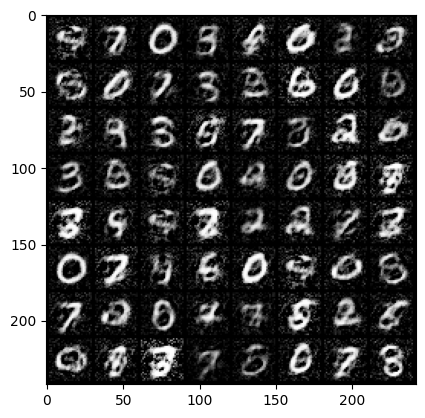

Epoch [74/80] Batch 0/938             Loss D: 0.1303, Loss G: 3.7795
Epoch [74/80] Batch 100/938             Loss D: 0.3136, Loss G: 3.1947
Epoch [74/80] Batch 200/938             Loss D: 0.2868, Loss G: 3.8295
Epoch [74/80] Batch 300/938             Loss D: 0.3545, Loss G: 3.9368
Epoch [74/80] Batch 400/938             Loss D: 0.2860, Loss G: 3.6936
Epoch [74/80] Batch 500/938             Loss D: 0.2347, Loss G: 4.0525
Epoch [74/80] Batch 600/938             Loss D: 0.1450, Loss G: 4.4929
Epoch [74/80] Batch 700/938             Loss D: 0.3886, Loss G: 3.2719
Epoch [74/80] Batch 800/938             Loss D: 0.1557, Loss G: 4.0172
Epoch [74/80] Batch 900/938             Loss D: 0.1532, Loss G: 3.2725


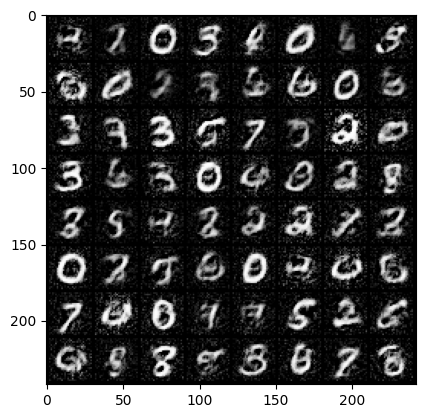

Epoch [75/80] Batch 0/938             Loss D: 0.3690, Loss G: 3.6553
Epoch [75/80] Batch 100/938             Loss D: 0.3090, Loss G: 4.2757
Epoch [75/80] Batch 200/938             Loss D: 0.4016, Loss G: 3.5522
Epoch [75/80] Batch 300/938             Loss D: 0.4902, Loss G: 3.7158
Epoch [75/80] Batch 400/938             Loss D: 0.3982, Loss G: 3.2941
Epoch [75/80] Batch 500/938             Loss D: 0.3341, Loss G: 4.2064
Epoch [75/80] Batch 600/938             Loss D: 0.1900, Loss G: 4.0527
Epoch [75/80] Batch 700/938             Loss D: 0.3113, Loss G: 4.3464
Epoch [75/80] Batch 800/938             Loss D: 0.3573, Loss G: 3.5147
Epoch [75/80] Batch 900/938             Loss D: 0.3455, Loss G: 4.4866


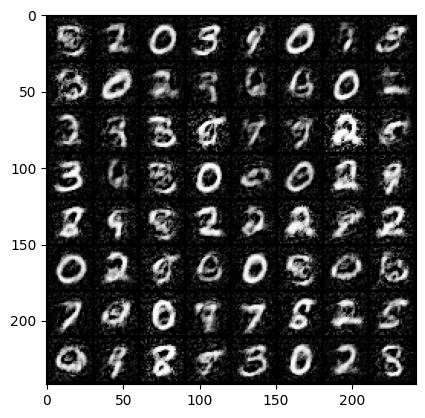

Epoch [76/80] Batch 0/938             Loss D: 0.3025, Loss G: 4.2898
Epoch [76/80] Batch 100/938             Loss D: 0.2723, Loss G: 4.1877
Epoch [76/80] Batch 200/938             Loss D: 0.3203, Loss G: 3.6613
Epoch [76/80] Batch 300/938             Loss D: 0.4661, Loss G: 3.5728
Epoch [76/80] Batch 400/938             Loss D: 0.4907, Loss G: 3.7282
Epoch [76/80] Batch 500/938             Loss D: 0.3368, Loss G: 4.0701
Epoch [76/80] Batch 600/938             Loss D: 0.3293, Loss G: 3.3489
Epoch [76/80] Batch 700/938             Loss D: 0.2710, Loss G: 4.3161
Epoch [76/80] Batch 800/938             Loss D: 0.3560, Loss G: 3.1449
Epoch [76/80] Batch 900/938             Loss D: 0.3029, Loss G: 3.8106


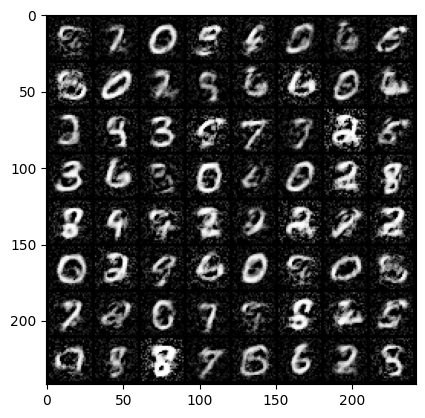

Epoch [77/80] Batch 0/938             Loss D: 0.2834, Loss G: 3.8512
Epoch [77/80] Batch 100/938             Loss D: 0.2100, Loss G: 4.1544
Epoch [77/80] Batch 200/938             Loss D: 0.2190, Loss G: 4.0417
Epoch [77/80] Batch 300/938             Loss D: 0.3335, Loss G: 4.0605
Epoch [77/80] Batch 400/938             Loss D: 0.2458, Loss G: 3.5134
Epoch [77/80] Batch 500/938             Loss D: 0.2837, Loss G: 4.0951
Epoch [77/80] Batch 600/938             Loss D: 0.2596, Loss G: 3.8339
Epoch [77/80] Batch 700/938             Loss D: 0.4025, Loss G: 4.1603
Epoch [77/80] Batch 800/938             Loss D: 0.4593, Loss G: 3.6525
Epoch [77/80] Batch 900/938             Loss D: 0.2201, Loss G: 3.5497


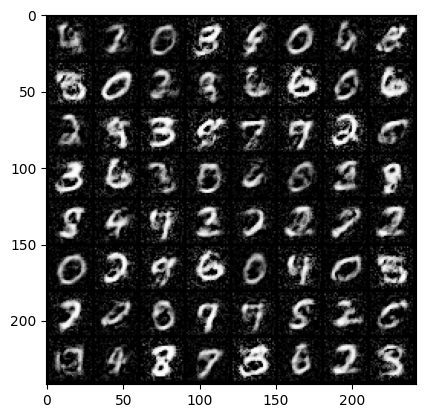

Epoch [78/80] Batch 0/938             Loss D: 0.4632, Loss G: 4.0774
Epoch [78/80] Batch 100/938             Loss D: 0.3720, Loss G: 3.5071
Epoch [78/80] Batch 200/938             Loss D: 0.1457, Loss G: 4.1428
Epoch [78/80] Batch 300/938             Loss D: 0.4574, Loss G: 3.5172
Epoch [78/80] Batch 400/938             Loss D: 0.2314, Loss G: 3.6285
Epoch [78/80] Batch 500/938             Loss D: 0.2609, Loss G: 3.8805
Epoch [78/80] Batch 600/938             Loss D: 0.3941, Loss G: 3.9465
Epoch [78/80] Batch 700/938             Loss D: 0.3563, Loss G: 4.3388
Epoch [78/80] Batch 800/938             Loss D: 0.2184, Loss G: 4.0726
Epoch [78/80] Batch 900/938             Loss D: 0.3092, Loss G: 3.5492


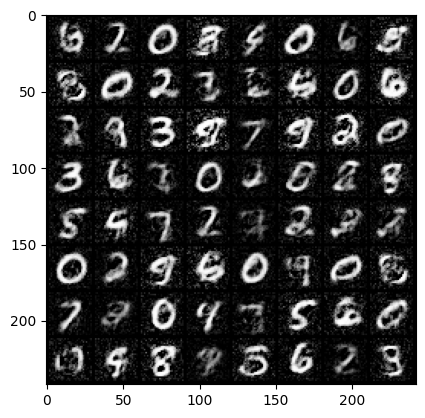

Epoch [79/80] Batch 0/938             Loss D: 0.3598, Loss G: 3.8328
Epoch [79/80] Batch 100/938             Loss D: 0.3644, Loss G: 3.3768
Epoch [79/80] Batch 200/938             Loss D: 0.3347, Loss G: 3.8276
Epoch [79/80] Batch 300/938             Loss D: 0.3191, Loss G: 3.5238
Epoch [79/80] Batch 400/938             Loss D: 0.3816, Loss G: 4.4880
Epoch [79/80] Batch 500/938             Loss D: 0.3978, Loss G: 4.0152
Epoch [79/80] Batch 600/938             Loss D: 0.3147, Loss G: 3.9945
Epoch [79/80] Batch 700/938             Loss D: 0.3454, Loss G: 4.0904
Epoch [79/80] Batch 800/938             Loss D: 0.2623, Loss G: 4.3168


In [ ]:
#Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64,100)

for epoch in range(num_epochs):
  for i,(data,_) in enumerate(trainloader):
    real_data = data
    batch_size = real_data.size(0)

    #Train the discriminator
    #Generate Fake Data
    noise = torch.randn(batch_size,100)
    fake_data = generator(noise)

    label_real = torch.full((batch_size,),1,dtype=torch.float)
    label_fake = torch.full((batch_size,),0,dtype=torch.float)

    output_real = discriminator(real_data).view(-1)
    lossD_real = criterion(output_real,label_real)

    output_fake = discriminator(fake_data.detach()).view(-1)
    lossD_fake = criterion(output_fake,label_fake)

    lossD = lossD_real + lossD_fake

    OptimizerD.zero_grad()
    lossD.backward()
    OptimizerD.step()

    #Train the generator
    output_fake = discriminator(fake_data).view(-1)
    lossG = criterion(output_fake,label_real)

    OptimizerG.zero_grad()
    lossG.backward()
    OptimizerG.step()


    #Visualizing the results of training
    #Epoch [0/80] Batch 0/938                   Loss D: 1.3865, Loss G: 0.6956

    if i % 100 == 0:
      print(f'Epoch [{epoch}/{num_epochs}] Batch {i}/{len(trainloader)} \
            Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}')

  with torch.no_grad():
      fake_images = generator(fixed_noise).detach()
  img_grid = torchvision.utils.make_grid(fake_images)  # (Channel,Height,Width)
  np_img = img_grid.numpy()
  plt.imshow(np.transpose(np_img,(1,2,0)))  #(Height,Width,Channel)
  plt.show()